In [1]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
np.random.seed(0)
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [2]:
pl.style.use('fabiostyle')
pl.rcParams['pdf.fonttype']=42
pl.rcParams['ps.fonttype']=42
# needs to find the library of functions
sys.path.append('../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [3]:
NOTEBOOK_NAME = 'decoding_four_odors_across_combined_ALL'

In [4]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

Unable to restore variable 'annotate_heatmap', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'heatmap', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'combine_train_test_patterns', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_prediction_combined_across', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_prediction_combined_within', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_predict_across', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_predict_within', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)


In [5]:
# use `save_worspace(db)` to save variables at the end
pl.rcParams['pdf.fonttype']=42
pl.rcParams['ps.fonttype']=42

In [6]:
from sklearn.model_selection import cross_val_score, cross_val_predict, LeaveOneOut
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC, LinearSVC
import numpy as np
cv = LeaveOneOut()

decoder = LinearSVC()

In [7]:
#for confusion matrix (use predict instead of score)
def do_prediction_combined_within(animals, patterns, labels, ncells=None, cellreg=False, n_steps=15, **args):
    
    scores, test_labels = do_predict_within(patterns, labels, **args) #had to remove n_loops to be able to extract 'test_labels'
    
    if ncells is None:
        total_n = np.sum([patterns[ani].shape[1] for ani in animals])
        ncells = np.repeat(np.r_[np.linspace(5, total_n, n_steps).astype(int)], 5)
        
    scores_ncells, test_labels_ncells = np.r_[[do_predict_within(patterns, labels, n_cells=n, **args) 
                                        for n in ncells]]
    
    return scores, test_labels, ncells, scores_ncells, test_labels_ncells

def do_predict_within(patterns, labels, **args):
    x, y, xT, test_labels = combine_train_test_patterns(patterns, labels, **args)
    decoder.fit(x, y)
    return decoder.predict(xT), test_labels

In [8]:
#for confusion matrix (use predict instead of score)
def do_prediction_combined_across(patterns_train,labels_train,patterns_test,labels_test,ncells=None,n_steps=10,**args):
    
    #scores, test_labels = do_predict_across(patterns, labels, **args) #had to remove n_loops to be able to extract 'test_labels'
    
    if ncells is None:
        total_n = np.sum([patterns_train[ani].shape[1] for ani in patterns_train.keys()])
        ncells = np.r_[np.linspace(2, total_n, n_steps).astype(int)]
    else:
        ncells = np.r_[np.linspace(2, ncells, n_steps).astype(int)]
        
    #test_scores_ncells, test_labels_ncells,train_scores_ncells,train_labels_ncells = np.r_[[do_predict_across(patterns_train,labels_train,patterns_test,labels_test,train_test_split=0.5,n_cells=n,**args) for n in ncells]]
    ncells_scores = np.r_[[do_predict_across(patterns_train,labels_train,patterns_test,labels_test,n_cells=n,**args) for n in ncells]]
    
    return ncells_scores,ncells

#def do_test_across(patterns_train, labels_train, patterns_test, labels_test, **args):
#    x, y, _, _ = combine_train_test_patterns(patterns_train, labels_train, train_test_split=1, **args)
#    xT, yT, _, _ = combine_train_test_patterns(patterns_test, labels_test, train_test_split=1, **args)
#    decoder.fit(x, t)
#    return decoder.score(xT, yT)

def do_predict_across(patterns_train,labels_train,patterns_test,labels_test,**args):
    x, train_labels, _, _ = combine_train_test_patterns(patterns_train, labels_train,train_test_split=0.5, **args)
    xT, test_labels, _, _ = combine_train_test_patterns(patterns_test, labels_test,train_test_split=0.5, **args)
    decoder.fit(x,train_labels)
    prediction_test = decoder.predict(xT)
    decoder.fit(xT,test_labels)
    prediction_train = decoder.predict(x)
    return prediction_train,train_labels,prediction_test,test_labels

def combine_train_test_patterns_within(patterns, labels, classes=None, n_cells=None,train_test_split=0.5,
                                relabel=None, relabel_test=None):
    if classes is None:
        classes = [0, 1]

    which_train = {}
    which_test = {}
    for ani in patterns.keys():
        which_trains = []
        which_tests = []
        for l in classes:
            if l>=0:
                wt = np.random.permutation(np.where(labels[ani]==l)[0])
                if train_test_split<1:
                    wT = wt[:int(len(wt)*train_test_split)]
                    which_trains.append(wt[int(len(wt)*train_test_split):])
                    which_tests.append(wT)
                else:
                    which_trains.append(wt)
        which_train[ani] = np.concatenate(which_trains)
        if train_test_split<1:
            which_test[ani] = np.concatenate(which_tests)
    
    patterns_t = patterns.copy()
    labels_t = labels.copy()
    for ani in patterns.keys():
        patterns_t[ani] = patterns[ani][which_train[ani]]
        labels_t[ani] = labels[ani][which_train[ani]]
    patterns_comb_train, labels_comb_ = ut.combine_patterns(patterns_t, labels_t, classes=classes)
        
    if train_test_split<1:
        patterns_T = patterns.copy()
        labels_T = labels.copy()
        for ani in patterns.keys():
            patterns_T[ani] = patterns[ani][which_test[ani]]
            labels_T[ani] = labels[ani][which_test[ani]]
        patterns_comb_test, labels_comb_test_ = ut.combine_patterns(patterns_T, labels_T, classes=classes)
    else:
        patterns_comb_test = None
    
    if relabel is not None:
        labels_comb = np.r_[[relabel[l] for l in labels_comb_]]
    else:
        labels_comb = labels_comb_
    
    if relabel_test is not None:
        labels_comb_test = np.r_[[relabel_test[l] for l in labels_comb_test_]]
    else:
        if relabel is not None:
            labels_comb_test = np.r_[[relabel[l] for l in labels_comb_test_]]
        else:
            labels_comb_test = labels_comb_test_
    
## OK, SO I HAD TROUBLE WITH THIS. YOU CAN NOT SEPARATELY SELECT A RANDOM PERMUTATION OF CELLS ACROSS SESSIONS, OR ELSE
## YOUR DECODER WILL BE USING DIFFERENT IDENTITY CELLS WHEN TRAINING AND TESTING!!!!!    
    if n_cells is None:
        which_cells = [True]*patterns_comb_train.shape[1]
    else:
        which_cells = np.random.permutation(range(patterns_comb_train.shape[1]))[:n_cells]
     
    patterns_comb_train = patterns_comb_train[:, which_cells]
    patterns_comb_test = patterns_comb_test[:, which_cells] if train_test_split<1 else patterns_comb_test

    return (patterns_comb_train[labels_comb>=0], labels_comb[labels_comb>=0],
            patterns_comb_test[labels_comb_test>=0], labels_comb_test[labels_comb_test>=0])

In [9]:
import matplotlib

def heatmap(data, row_labels, col_labels, ax=None, cmap='viridis',
            cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (N, M).
    row_labels
        A list or array of length N with the labels for the rows.
    col_labels
        A list or array of length M with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if not ax:
        ax = pl.gca()

    # Plot the heatmap
    im = ax.imshow(data, cmap, origin="lower", **kwargs)

    # Create colorbar
    #cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    #cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels, fontsize=7)
    ax.set_yticklabels(row_labels, fontsize=7)

    # Let the horizontal axes labeling appear on top.
    #ax.tick_params(top=True, bottom=False,
    #               labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    pl.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

    # Turn spines off and create white grid.
    #for edge, spine in ax.spines.items():
    #    spine.set_visible(False)

    #ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    #ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    #ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    ax.tick_params(axis='both', bottom=False, left=False,pad=0)

    return im#, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=["white", "black"],
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A list or array of two color specifications.  The first is used for
        values below a threshold, the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

In [10]:
#vhpc_animals = [ani for ani in animals if ani[0]!='d']
vhpc_expo_animals = '94', '96', '98', '99', '100', '104', 'c18m9', 'vNAc7'
vhpc_pre_animals =  '94', '96', '98', '99', '100', '104', 'c18m9', 'vNAc7'
vhpc_post_animals = '94', '96', '98', '99', '100', '104', 'c18m9', 'vNAc7'
vhpc_post_hiatus_animals = '94', '96', '98', '99', '100', '104', 'c18m9', 'vNAc7'

dhpc_expo_animals = 'dhpc37', 'dhpc39', 'dhpc40', 'dNAc3', 'dNAc4'
dhpc_pre_animals =  'dhpc37', 'dhpc39', 'dhpc40', 'dNAc3', 'dNAc4'
dhpc_post_animals = 'dhpc37', 'dhpc39', 'dhpc40', 'dNAc3', 'dNAc4'
dhpc_post_hiatus_animals = 'dhpc37', 'dhpc39', 'dhpc40', 'dNAc3', 'dNAc4'

In [14]:
delta_t05s = 0.5
t_start05s = -5.5 
t_stop05s = 10.5

delta_t1s = 1
t_start1s = -5 
t_stop1s  = 11 

delta_t15s = 1
t_start15s = -5.5 
t_stop15s = 10.5  

delta_t2s = 2
t_start2s = -4
t_stop2s  = 10

In [27]:
regions = 'dhpc','vhpc'
sessions = 'expo','pre','post','post_hiatus'
CR_comparisons = 'prepost','prepost_hiatus','postpost_hiatus' #exclude expo session, since did not cellreg this
durations=([0,1],[1,2],[2,3],[3,4],[4,5],[5,6])
bins = ['05s','1s','15s','2s']
bin_ranges=[]
for tb in bins:
    if tb == '05s':
        div=0.5
    elif tb=='15s':
        div=1.0
    else:
        div=tb[:-1]
    bin_ranges.append(int(eval("(t_stop%s-t_start%s)/%s"%(tb,tb,div))))
classes = range(1,5)

In [493]:
for reg in regions:
    for sess in sessions:
        for var in ('time_ax', 'traces', 'events', 'cycles',
            'is_STIM1t', 'is_STIM2t', 'is_STIM3t', 'is_STIM4t','CYCLE_START', 'CS_DURATION', 'DELAY'):
            exec ('%s_%s_%s = {}'%(var,reg, sess))
            for ani in eval('%s_%s_animals'%(reg,sess)):
                if sess == 'expo':
                    folder = '../%s/4_odor_expo/notebooks/autorestore/preprocessing'%(ani)
                else:
                    folder = '../%s/%s/notebooks/autorestore/preprocessing'%(ani,sess)
                try:
                    eval('%s_%s_%s'%(var,reg,sess)).update({ani: ut.load_variable(var, folder)})
                except IOError:
                    print 'error'
                    continue

for reg in regions:
    for sess in sessions:
        exec("labels_%s_%s = dict(zip(%s_%s_animals, [ut.load_variable('labels_%s',\
                                    '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                    for ani in %s_%s_animals]))"%(reg,sess, reg,sess, sess, reg,sess))

In [494]:
for reg in regions:
    for tb in bins:
        for sess in sessions:
            try:
                exec("patterns_%s_%s_%s = dict(zip(%s_%s_animals, [ut.load_variable('patterns_evs_%s_%s',\
                                                                   '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                          for ani in %s_%s_animals]))"%(reg,tb,sess,reg,sess,tb,sess,reg,sess))
            except:
                print 'nope %s %s'%(tb,sess)
#get patterns of cells registered across all 3 sessions
        for sess in sessions[1:]: #leave out expo since did not register to this session
            exec("cellreg_patterns_%s_%s_reg_w_all_%s = dict(zip(%s_%s_animals, [ut.load_variable('patterns_evs_reg_%s_%s_all',\
                                                                   '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                          for ani in %s_%s_animals]))"%(reg,tb,sess,reg,sess,tb,sess,reg,sess))
            exec("labels_%s = dict(zip(%s_%s_animals, [ut.load_variable('labels_%s',\
                                                                 '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                          for ani in %s_%s_animals]))"%(sess,reg,sess,sess,reg,sess))

In [495]:
for reg in regions:
    for sess in sessions:
        for tb,i in zip(bins,range(len(bins))):
            for t in range(bin_ranges[i]):
                exec('patterns_%s_%s_%s_%s = {}'%(reg,tb,sess,t))
                for ani in eval('%s_%s_animals'%(reg,sess)):
                    try:
                        #print sess, tb, ani,
                        exec("patterns_%s_%s_%s_%s['%s'] = patterns_%s_%s_%s['%s'][%s]"%(reg,tb,sess,t,ani,reg,tb,sess,ani,t))
                    except:
                        print 'NOPE',reg,sess, tb, ani
                        continue
    for sess in sessions[1:]:
        for tb,i in zip(bins,range(len(bins))):
            for t in range(bin_ranges[i]):
                exec('cellreg_patterns_%s_%s_%s_%s = {}'%(reg,tb,sess,t))
                for ani in eval('%s_%s_animals'%(reg,sess)):
                    exec("cellreg_patterns_%s_%s_%s_%s['%s'] = cellreg_patterns_%s_%s_reg_w_all_%s['%s'][%s]"%(reg,tb,sess,t,ani,reg,tb,sess,ani,t))

In [364]:
loops=100

#### commenting out the below so cells are accidentally run again

In [112]:
##1.5hrs to run this cell
#%%time
##for time bins durations of 0.5 and 1s, predict odor delivered for each bin. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
#        print reg,cr
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                for n in range(loops):
#                    print n,
#                    exec("test_predictions_%s_%s_%s_%s_%s,test_labels_%s_%s_%s,train_predictions_%s_%s_%s_%s_%s,\
#                    train_labels_%s_%s_%s = do_predict_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
#                    labels_%s_%s,train_test_split=0.5,n_cells=102,classes=range(1, 5))"\
#                    %(reg,tb,cr,t,n,reg,cr,n,reg,tb,cr,t,n,reg,cr,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))

In [75]:
##13+ hours to run this cell!
#%%time
##for time bins durations of 0.5 and 1s, predict odor delivered for each bin. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
#        print reg,cr
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                for n in range(loops):
#                    print n,
#                    exec("ncells_predictions_%s_%s_%s_%s_%s,tot_ncells = do_prediction_combined_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
#                    labels_%s_%s,train_test_split=0.5,ncells=100,classes=range(1, 5),n_steps=5)"\
#                    %(reg,tb,cr,t,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))

#this was run differently from CSpm ncells below. Here did over 5 steps and doubled each step, and looped that 100 times,
# below ran over 10 steps and didn't duplicate and looped that 100 times.

 computing loop: dhpc prepost
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36

In [311]:
np.shape(ncells_predictions_vhpc_1s_prepost_5_5)

(10, 4, 400)

In [114]:
#%%time
#relabel = {1:0, 2:0, 3:1, 4:1}
##for time bins durations of 0.5 and 1s, predict CS+ or CS- for each bin. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
#        print reg,cr
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                for n in range(loops):
#                    print n,
#                    exec("CSpm_test_predictions_%s_%s_%s_%s_%s,_,CSpm_train_predictions_%s_%s_%s_%s_%s,\
#                    _ = do_predict_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
#                    labels_%s_%s,train_test_split=0.5,n_cells=102,classes=range(1, 5),relabel=relabel)"\
#                    %(reg,tb,cr,t,n,reg,tb,cr,t,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))
##get prediction labels (only need to do this once, really, so removed from loops above)
#_,CSpm_test_labels,_,_ = do_predict_across(cellreg_patterns_vhpc_1s_pre_0,labels_vhpc_pre,cellreg_patterns_vhpc_1s_post_0,\
#                    labels_vhpc_post,train_test_split=0.5,n_cells=102,classes=range(1, 5),relabel=relabel)

In [508]:
%%time
#for time bins durations of 0.5 and 1s, predict odor delivered for each bin. feed in progressively larger quantities of cells. Repeat n times (where n = loops). This takes a while
quant_cells = [20,40,60,80,100]
print 'computing loop:',
for reg in regions:
    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
        print reg,cr
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                print t,
                for q in quant_cells:
                    for n in range(loops):
                        exec("test_predictions_%s_%s_%s_%s_%s_%scells,test_labels_%s_%s_%s,train_predictions_%s_%s_%s_%s_%s_%scells,\
                        train_labels_%s_%s_%s = do_predict_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
                        labels_%s_%s,n_cells=q,classes=range(1, 5))"\
                        %(reg,tb,cr,t,n,q,reg,cr,n,reg,tb,cr,t,n,q,reg,cr,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))

 computing loop: dhpc prepost
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 0 1 2 3 4 5 6 7 8 9 10 11 12

KeyboardInterrupt: 

In [510]:
test_predictions_dhpc_1s_prepost_5_0_20cells

array([3, 3, 4, 2, 1, 1, 1, 3, 4, 2, 4, 1, 2, 3, 4, 1, 3, 3, 4, 3, 1, 3, 4,
       3, 4, 3, 4, 3, 3, 2, 2, 3, 4, 2, 4, 3, 4, 2, 1, 2, 2, 2, 4, 2, 3, 1,
       4, 3, 1, 3, 4, 2, 1, 3, 4, 4, 2, 2, 4, 1, 4, 2, 3, 4, 1, 3, 4, 3, 3,
       2, 4, 3, 2, 2, 4, 3, 4, 2, 1, 2, 3, 3, 4, 3, 2, 2, 4, 4, 4, 2, 1, 2,
       2, 2, 1, 4, 4, 3, 4, 1, 3, 3, 4, 4, 2, 2, 4, 4, 4, 2, 4, 4, 1, 2, 4,
       2, 2, 2, 1, 3, 2, 1, 4, 4, 1, 2, 4, 1, 3, 2, 1, 2, 4, 2, 4, 4, 2, 2,
       1, 3, 3, 2, 4, 4, 3, 2, 4, 4, 3, 2, 4, 4, 2, 3, 4, 3, 2, 2, 4, 4, 1,
       1, 4, 3, 4, 2, 4, 3, 4, 3, 4, 4, 4, 2, 4, 2, 2, 3, 4, 4, 2, 2, 4, 3,
       2, 3, 4, 3, 3, 2, 4, 3, 2, 2, 1, 2, 3, 3, 1, 2, 3, 2, 4, 3, 4, 2, 3,
       4, 1, 3, 1, 3, 2, 2, 4, 4, 4, 3, 4, 4, 3, 3, 4, 4, 3, 2, 1, 4, 4, 2,
       1, 4, 1, 3, 3, 4, 2, 2, 1, 3, 4, 3, 4, 2, 1, 3, 1, 2, 4, 1, 4, 3, 4,
       2, 1, 3, 4, 3, 4, 4, 3, 2, 4, 4, 4, 3, 1, 3, 2, 2, 4, 3, 3, 2, 4, 3,
       2, 2, 4, 2, 2, 3, 4, 3, 3, 2, 4, 4, 3, 3, 4, 4, 2, 1, 1, 4, 4, 3, 2,
       4, 2,

In [511]:
for q in quant_cells:
    print sum(eval("test_predictions_dhpc_1s_prepost_5_0_%scells==test_labels_dhpc_prepost_5"%q))

108
176
81
46
109


In [505]:
%%time
#for time bins durations of 0.5 and 1s, predict odor delivered for each bin. Repeat n times (where n = loops). This takes a while
print 'computing loop:',
for reg in regions:
    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
        print reg,cr
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                for n in range(loops):
                    print n,
                    exec("sanityT_%s_%s_%s_%s_%s,test_labels_%s_%s_%s,sanityt_%s_%s_%s_%s_%s,\
                    train_labels_%s_%s_%s = do_predict_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
                    labels_%s_%s,train_test_split=0.5,n_cells=102,classes=range(1, 5))"\
                    %(reg,tb,cr,t,n,reg,cr,n,reg,tb,cr,t,n,reg,cr,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))

computing loop: dhpc prepost
0

TypeError: combine_train_test_patterns() got multiple values for keyword argument 'train_test_split'

In [501]:
print sanityt_dhpc_1s_postpost_hiatus_5_0
print test_labels_dhpc_postpost_hiatus_3

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 3 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 3 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1
 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2
 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1 2 3 4 1

In [467]:
##I JUST CANT GET THIS TO WORK AS EXPECTED. PREDICTION ACCURACY DOES NOT CHANGE WITH CELL #. I MUST BE DOING SOMETHING WRONG.
#%%time
#relabel = {1:0, 2:0, 3:1, 4:1}
##for time bins durations of 0.5 and 1s, predict CS+vsCS- for each bin. do this for diff cell quantities fed to decoder. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for cr,sess in zip(CR_comparisons,[['pre','post'],['pre','post_hiatus'],['post','post_hiatus']]):
#        print reg,cr
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                print t,
#                for n in range(loops):                   
#                    exec("ncells_CSpm_predictions_%s_%s_%s_%s_%s,CSpm_ncells = do_prediction_combined_across(cellreg_patterns_%s_%s_%s_%s,labels_%s_%s,cellreg_patterns_%s_%s_%s_%s,\
#                    labels_%s_%s,train_test_split=0.5,ncells=100,classes=range(1, 5),relabel=relabel,n_steps=3)"\
#                    %(reg,tb,cr,t,n,reg,tb,sess[0],t,reg,sess[0],reg,tb,sess[1],t,reg,sess[1]))
#                    
##ncells_CSpm_predictions_etc returns an array of shape n_steps x result category (T predictions, T labels, t predictions, t labels) x results 

In [398]:
def plot_scores_vs_ncells(ncells, scores, labels=True, dot_color=(1, 0.7, 0.7), color='r', chance=None, ax=None):
    if ax is None:
        fig, ax = pl.subplots(1, 1, figsize=(1, 1))
    ax.plot(ncells, scores, 'o', ms=2, mew=0, color=dot_color, zorder=0)
    #ax.errorbar(ncells[::#loops], scores.reshape(-1, n_loops).mean(1)*100,
    #            np.std(scores.reshape(-1, n_loops), 1)*100,
    #            color=color)
    ax.set_ylim(0, 100)
    
    if labels:
        ax.set_xlabel("No. of Cells")
        ax.set_ylabel("Performance")

    if chance is not None:
        xmin, xmax, _, _  = ax.axis()
        ax.hlines(chance, xmin, xmax, linestyles='dashed', lw=0.5, color='k')

    # if savefig:
    # fig.savefig('../img/%s__bars.pdf'%NOTEBOOK_NAME)
    # np.savetxt('../img/%s__bars.pvs'%NOTEBOOK_NAME,  pvs, header='Mann-Whitney U two-sided')
    return ax

In [373]:
type(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[0])

numpy.ndarray

In [449]:
np.r_[[np.sum(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[m,0]*ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[m,1]) for m in range(3)]]

array([  0,  20, 183])

In [458]:
ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_6_0[1,0]

array([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 1,

In [452]:
(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[2,0]==ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[2,1])

array([False, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True, False, False,  True,  True, False, False,
        True,  True, False, False,  True,  True, False, False,  True,
        True, False, False,  True,  True, False, False,  True,  True,
       False, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True, False, False,  True,  True, False, False,
        True,  True, False, False,  True,  True, False, False,  True,
        True, False, False,  True,  True, False, False,  True,  True,
       False, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True, False, False,  True,  True, False, False,
        True,  True, False, False,  True,  True,  True, False,  True,
        True, False, False,  True,  True, False, False,  True,  True,
       False, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True, False, False,  True,  True,  True, False,
        True,  True,

In [397]:
CSpm_ncells

array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100])

In [413]:
for m in range(10):
    print np.sum(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[:,0,m]*ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[:,1,m])/2

0
0
5
5
0
0
5
5
0
0


In [478]:
sum(test_predictions_vhpc_1s_postpost_hiatus_5_0==test_labels_vhpc_postpost_hiatus_5)

362

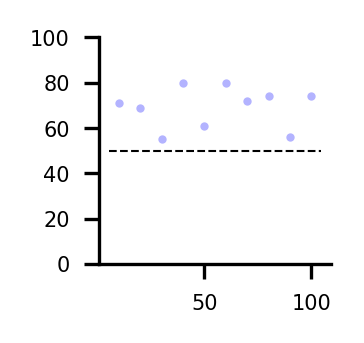

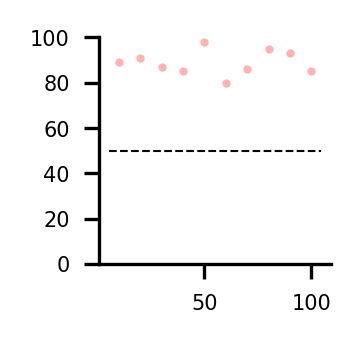

In [410]:
plot_scores_vs_ncells(CSpm_ncells,np.r_[[np.sum(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_10_0[m,2]*ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_5_0[m,1])/2 for m in range(10)]], dot_color=(0.7, 0.7, 1), color='b', chance=50, labels=False)
plot_scores_vs_ncells(CSpm_ncells,np.r_[[np.sum(ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_9_0[m,2]*ncells_CSpm_predictions_vhpc_1s_postpost_hiatus_8_0[m,1])/2 for m in range(10)]], chance=50, labels=False)

## print np.sum(ncells_CSpm_predictions_dhpc_1s_prepost_8_0[0][0]*ncells_CSpm_predictions_dhpc_1s_prepost_8_0[1][1])
print np.sum(ncells_CSpm_predictions_dhpc_1s_prepost_8_0[9][0]*ncells_CSpm_predictions_dhpc_1s_prepost_8_0[1][1])

In [370]:
CSpm_ncells

array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100])

In [171]:
#%%time
##for time bins durations of 0.5 and 1s, predict CS+ or CS- for each bin. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for sess in sessions[1:]:
#        print reg,sess
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                for n in range(loops):
#                    print n,
#                    exec("predictions_%s_%s_%s_%s_%s, test_labels = do_predict_within(cellreg_patterns_%s_%s_%s_%s,\
#                        labels_%s_%s,classes=range(1, 5),n_cells=102)"%(reg,tb,sess,t,n,reg,tb,sess,t,reg,sess))

 computing loop: dhpc pre
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 

In [172]:
#%%time
#relabel = {1:0, 2:0, 3:1, 4:1}
##for time bins durations of 0.5 and 1s, predict CS+ or CS- for each bin. Repeat n times (where n = loops). This takes a while
#print 'computing loop:',
#for reg in regions:
#    for sess in sessions[1:]:
#        print reg,sess
#        for tb,i in zip(bins[:2],range(len(bins[:2]))):
#            for t in range(bin_ranges[i]): # number of time bins
#                for n in range(loops):
#                    print n,
#                    exec("CSpm_predictions_%s_%s_%s_%s_%s, CSpm_test_labels = do_predict_within(cellreg_patterns_%s_%s_%s_%s,\
#                        labels_%s_%s,classes=range(1, 5),n_cells=102, relabel=relabel)"%(reg,tb,sess,t,n,reg,tb,sess,t,reg,sess))

computing loop: dhpc pre
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 3

In [80]:
#append all loops
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("test_predictions_%s_%s_%s_%s_appended = np.append(test_predictions_%s_%s_%s_%s_0,test_predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                exec("test_labels_%s_%s_appended = np.append(test_labels_%s_%s_0,test_labels_%s_%s_1)"%(reg,sess,reg,sess,reg,sess))
                for n in range(2,loops):
                    exec("test_predictions_%s_%s_%s_%s_appended = np.append(test_predictions_%s_%s_%s_%s_appended,test_predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    exec("test_labels_%s_%s_appended = np.append(test_labels_%s_%s_appended,test_labels_%s_%s_%s)"%(reg,sess,reg,sess,reg,sess,n))

In [81]:
#append all loops
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("train_predictions_%s_%s_%s_%s_appended = np.append(train_predictions_%s_%s_%s_%s_0,train_predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                exec("train_labels_%s_%s_appended = np.append(train_labels_%s_%s_0,train_labels_%s_%s_1)"%(reg,sess,reg,sess,reg,sess))
                for n in range(2,loops):
                    exec("train_predictions_%s_%s_%s_%s_appended = np.append(train_predictions_%s_%s_%s_%s_appended,train_predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    exec("train_labels_%s_%s_appended = np.append(train_labels_%s_%s_appended,train_labels_%s_%s_%s)"%(reg,sess,reg,sess,reg,sess,n))

In [176]:
#append all loops
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("predictions_%s_%s_%s_%s_appended = np.append(predictions_%s_%s_%s_%s_0,predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                test_labels_appended = np.append(test_labels,test_labels)
                for n in range(2,loops):
                    exec("predictions_%s_%s_%s_%s_appended = np.append(predictions_%s_%s_%s_%s_appended,predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    test_labels_appended = np.append(test_labels_appended,test_labels)

In [177]:
#append all loops
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("CSpm_predictions_%s_%s_%s_%s_appended = np.append(CSpm_predictions_%s_%s_%s_%s_0,CSpm_predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                CSpm_test_labels_appended = np.append(CSpm_test_labels,CSpm_test_labels)
                for n in range(2,loops):
                    exec("CSpm_predictions_%s_%s_%s_%s_appended = np.append(CSpm_predictions_%s_%s_%s_%s_appended,CSpm_predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    CSpm_test_labels_appended = np.append(CSpm_test_labels_appended,CSpm_test_labels)

In [82]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_test_%s_%s_%s_%s_appended = confusion_matrix(test_labels_%s_%s_appended,\
                      test_predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,sess,reg,tb,sess,t))

In [83]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_train_%s_%s_%s_%s_appended = confusion_matrix(train_labels_%s_%s_appended,\
                      train_predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,sess,reg,tb,sess,t))

In [178]:
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_%s_%s_%s_%s_appended = confusion_matrix(test_labels_appended,\
                      predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,tb,sess,t))

In [179]:
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_CSpm_%s_%s_%s_%s_appended = confusion_matrix(CSpm_test_labels_appended,\
                      CSpm_predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,tb,sess,t))

In [84]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_test_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_test_%s_%s_%s.append(conf_matr_test_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))

In [85]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_train_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_train_%s_%s_%s.append(conf_matr_train_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))

In [180]:
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_%s_%s_%s.append(conf_matr_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))

In [181]:
for reg in regions:
    for sess in sessions[1:]:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_CSpm_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_CSpm_%s_%s_%s.append(conf_matr_CSpm_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))

In [87]:
print heatmaps_test_vhpc_1s_prepost[6]
print np.sum(heatmaps_test_vhpc_1s_prepost[6])
print (heatmaps_test_vhpc_1s_prepost[6]/5000.0)
print (4.*heatmaps_test_vhpc_1s_prepost[6]/np.sum(heatmaps_test_vhpc_1s_prepost[6]),1)

[[2715 2233 2328 2724]
 [2461 3186 2251 2102]
 [1505 2131 3675 2689]
 [1904 1819 3348 2929]]
40000
[[ 0.543   0.4466  0.4656  0.5448]
 [ 0.4922  0.6372  0.4502  0.4204]
 [ 0.301   0.4262  0.735   0.5378]
 [ 0.3808  0.3638  0.6696  0.5858]]
(array([[ 0.2715,  0.2233,  0.2328,  0.2724],
       [ 0.2461,  0.3186,  0.2251,  0.2102],
       [ 0.1505,  0.2131,  0.3675,  0.2689],
       [ 0.1904,  0.1819,  0.3348,  0.2929]]), 1)


## within-session using cross-registered cells

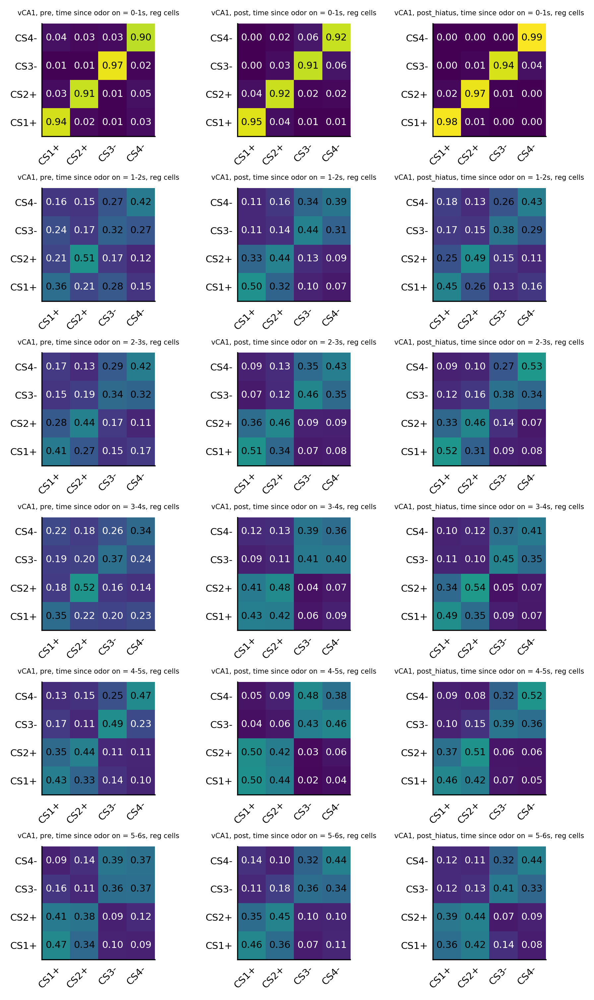

In [182]:
# plot 'em all
fig, ((ax0, ax1, ax2),(ax3, ax4, ax5),(ax6, ax7, ax8),(ax9, ax10, ax11),(ax12, ax13, ax14),(ax15, ax16, ax17),) = pl.subplots(6, 3, figsize=(6, 10))

session='pre'
for i,a in zip(range(5,11),range(0,16,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_vhpc_1s_%s[i]/np.sum(heatmaps_vhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post'
for i,a in zip(range(5,11),range(1,17,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_vhpc_1s_%s[i]/np.sum(heatmaps_vhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post_hiatus'
for i,a in zip(range(5,11),range(2,18,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_vhpc_1s_%s[i]/np.sum(heatmaps_vhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

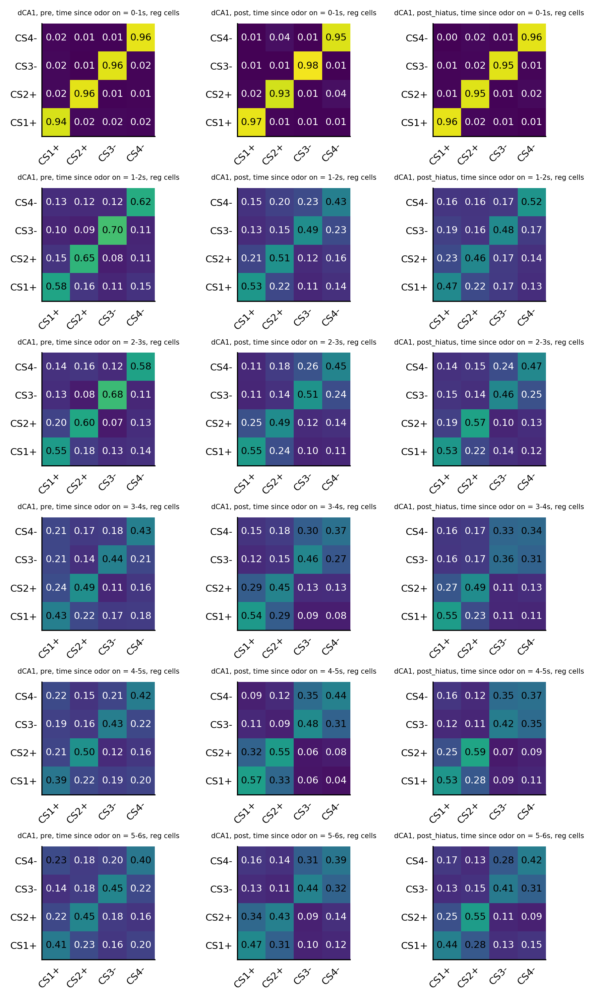

In [183]:
# plot 'em all
fig, ((ax0, ax1, ax2),(ax3, ax4, ax5),(ax6, ax7, ax8),(ax9, ax10, ax11),(ax12, ax13, ax14),(ax15, ax16, ax17),) = pl.subplots(6, 3, figsize=(6, 10))

session='pre'
for i,a in zip(range(5,11),range(0,16,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_dhpc_1s_%s[i]/np.sum(heatmaps_dhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post'
for i,a in zip(range(5,11),range(1,17,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_dhpc_1s_%s[i]/np.sum(heatmaps_dhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post_hiatus'
for i,a in zip(range(5,11),range(2,18,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("4.*heatmaps_dhpc_1s_%s[i]/np.sum(heatmaps_dhpc_1s_%s[i])"%(session,session)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_dhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

## across sessions

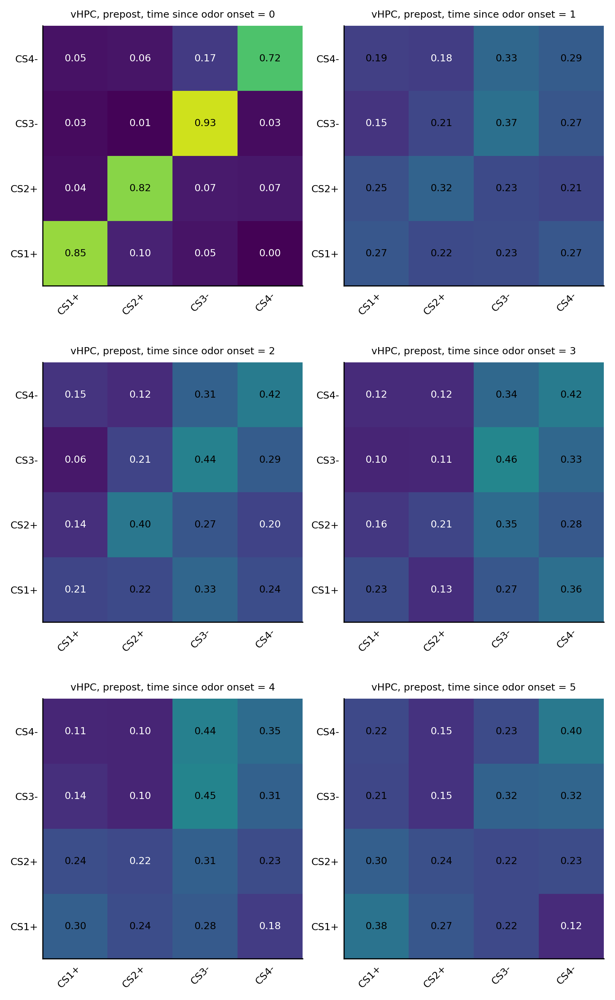

In [89]:
# plot 'em all

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5)) = pl.subplots(3, 2, figsize=(6, 10))

for i,a in zip(range(5,11),range(6)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(4.*heatmaps_test_vhpc_1s_prepost[i]/np.sum(heatmaps_test_vhpc_1s_prepost[i]),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                 (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vHPC, prepost, time since odor onset = %s"'%(str(i-5))))

pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

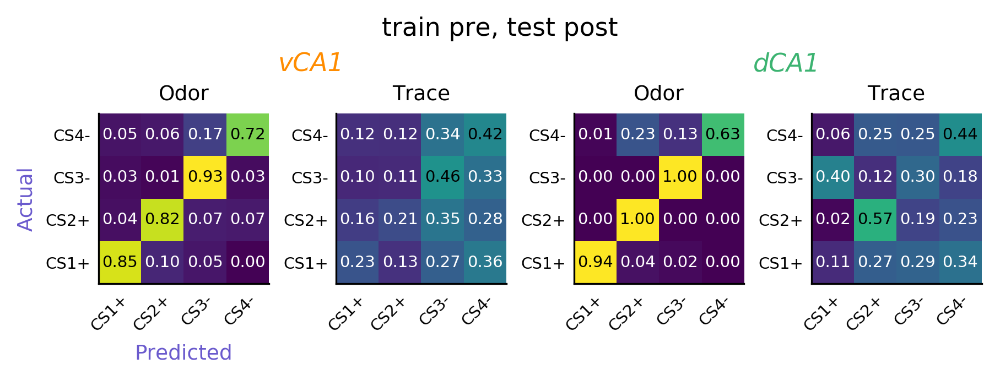

In [94]:
# plot 'em all

fig, ((ax1, ax2, ax3, ax4)) = pl.subplots(1, 4, figsize=(6, 2.5))

for reg,r in zip(('vhpc','dhpc'),(0,2)):
    for i,j,la in zip((5,8),(1,2),('Odor','Trace')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_test_%s_1s_prepost[i]/np.sum(heatmaps_test_%s_1s_prepost[i])"%(reg,reg)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=.9,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=7,threshold=.41)
        #eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=9)
ax1.set_title('Odor',fontsize=9)
ax2.set_title('Trace',fontsize=9)
ax3.set_title('Odor',fontsize=9)
ax4.set_title('Trace',fontsize=9)
for x in range(1,7):
    ax1.set_xlabel('Predicted',fontsize=9,color='slateblue')
    ax1.set_ylabel('Actual',fontsize=9,color='slateblue')
pl.suptitle('train pre, test post',fontsize=11,y=.95)
ax1.text(4.5,4.5,'vCA1',color='darkorange',fontstyle='italic',fontsize=11,ha='center')
ax3.text(4.5,4.5,'dCA1',color='mediumseagreen',fontstyle='italic',fontsize=11,ha='center')

    
pl.tight_layout(h_pad=4)
pl.show()
#fig.savefig('../figures/%s_confusion_matrices_dv_1s.pdf'%NOTEBOOK_NAME)

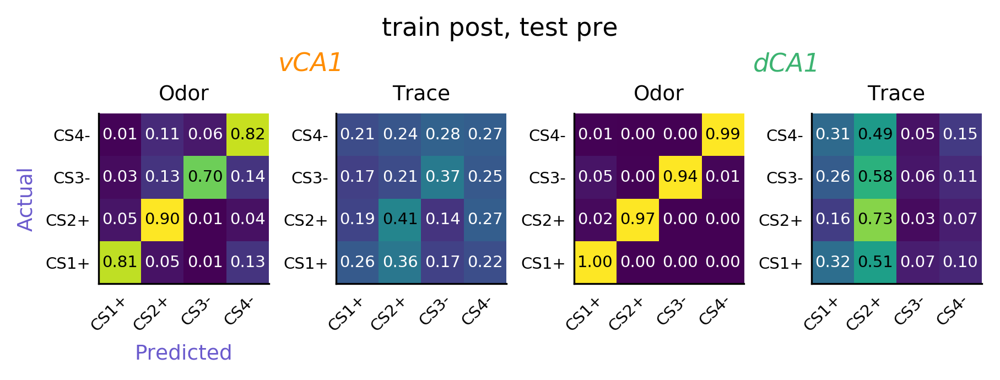

In [95]:
# plot 'em all

fig, ((ax1, ax2, ax3, ax4)) = pl.subplots(1, 4, figsize=(6, 2.5))

for reg,r in zip(('vhpc','dhpc'),(0,2)):
    for i,j,la in zip((5,8),(1,2),('Odor','Trace')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_train_%s_1s_prepost[i]/np.sum(heatmaps_train_%s_1s_prepost[i])"%(reg,reg)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=.9,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=7,threshold=.41)
        #eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=9)
ax1.set_title('Odor',fontsize=9)
ax2.set_title('Trace',fontsize=9)
ax3.set_title('Odor',fontsize=9)
ax4.set_title('Trace',fontsize=9)
for x in range(1,7):
    ax1.set_xlabel('Predicted',fontsize=9,color='slateblue')
    ax1.set_ylabel('Actual',fontsize=9,color='slateblue')
pl.suptitle('train post, test pre',fontsize=11,y=.95)
ax1.text(4.5,4.5,'vCA1',color='darkorange',fontstyle='italic',fontsize=11,ha='center')
ax3.text(4.5,4.5,'dCA1',color='mediumseagreen',fontstyle='italic',fontsize=11,ha='center')

    
pl.tight_layout(h_pad=4)
pl.show()
#fig.savefig('../figures/%s_confusion_matrices_dv_1s.pdf'%NOTEBOOK_NAME)

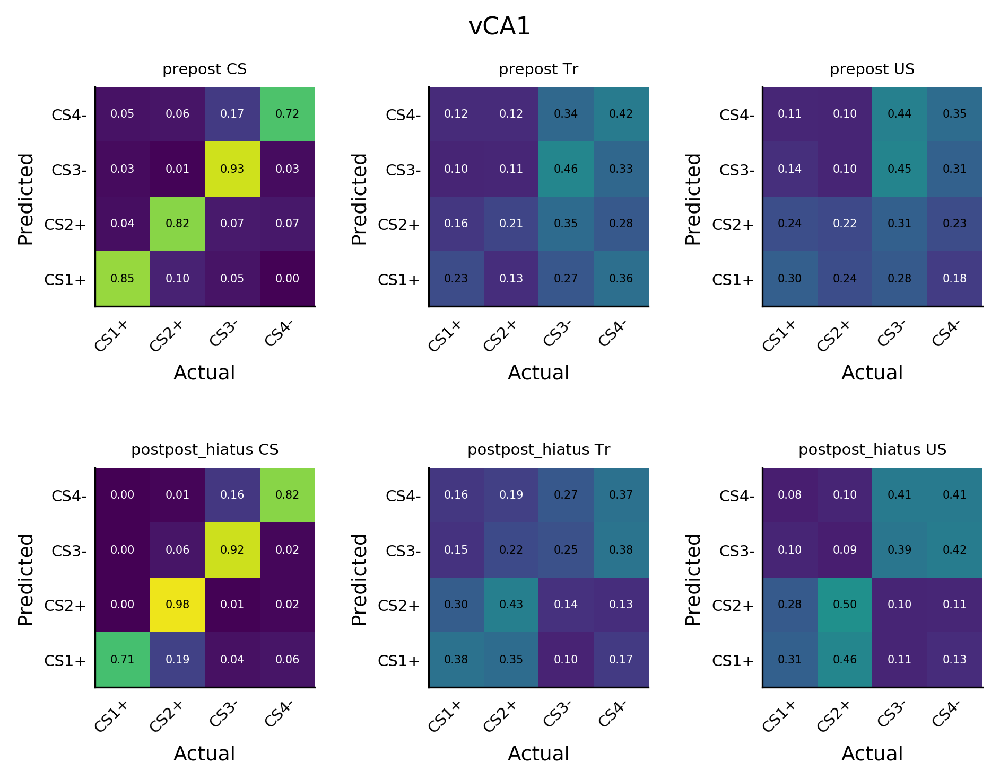

In [99]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_test_vhpc_1s_%s[i]/np.sum(heatmaps_test_vhpc_1s_%s[i])"%(sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

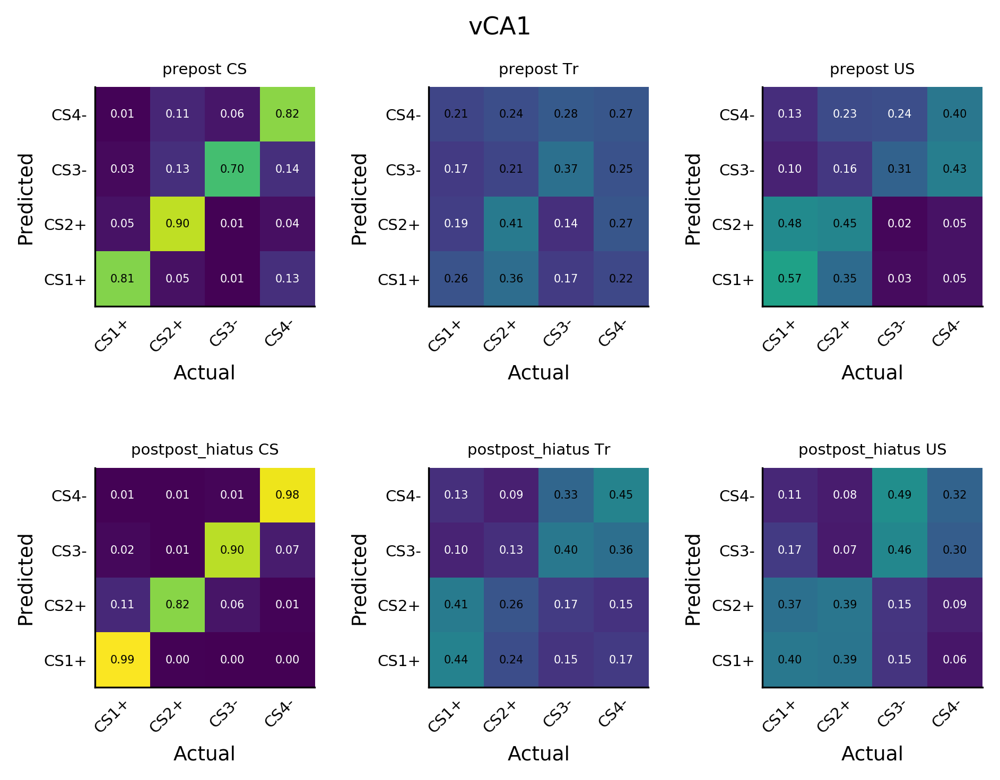

In [100]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_train_vhpc_1s_%s[i]/np.sum(heatmaps_train_vhpc_1s_%s[i])"%(sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

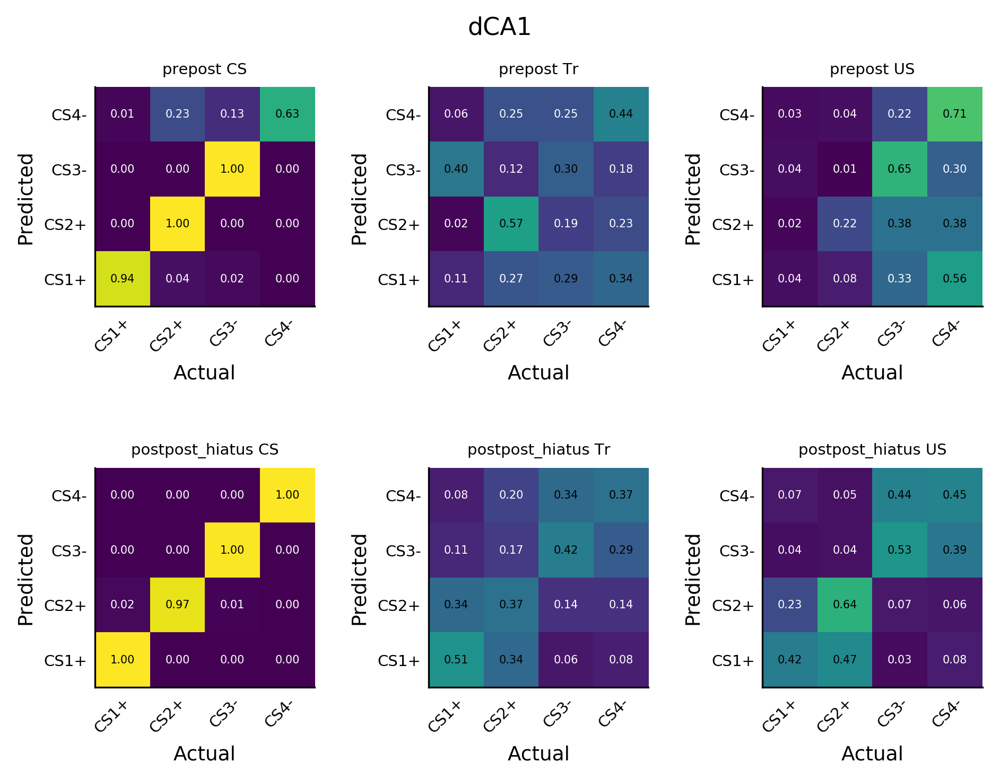

In [104]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_test_dhpc_1s_%s[i]/np.sum(heatmaps_test_dhpc_1s_%s[i])"%(sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_dhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

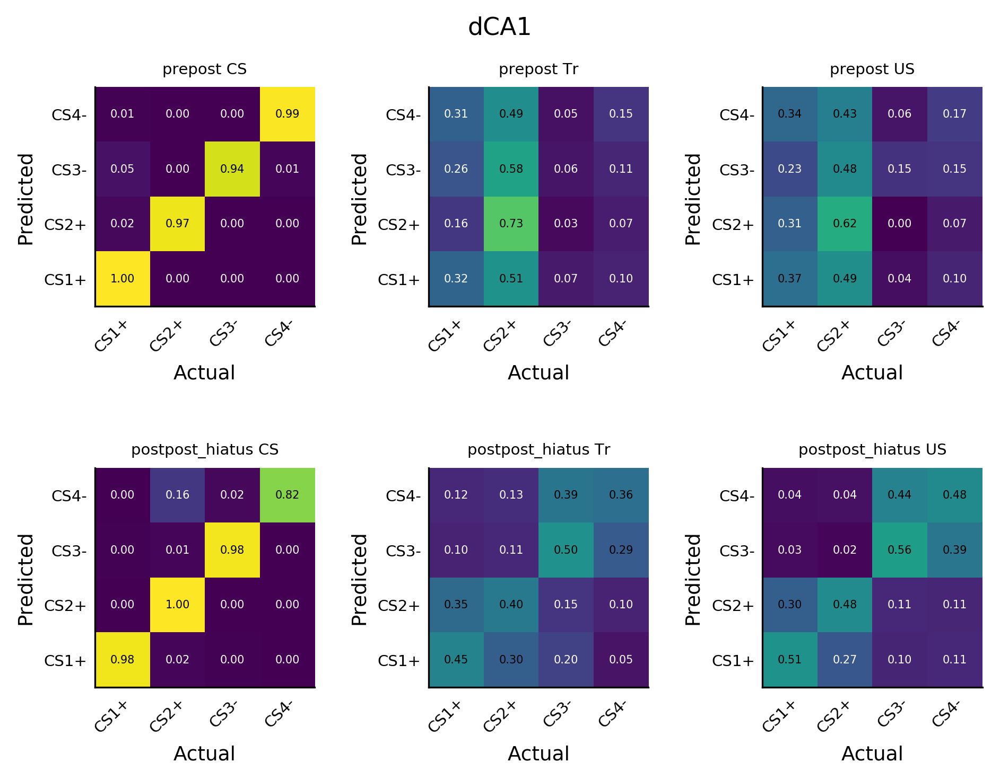

In [103]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_train_dhpc_1s_%s[i]/np.sum(heatmaps_train_dhpc_1s_%s[i])"%(sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_dhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

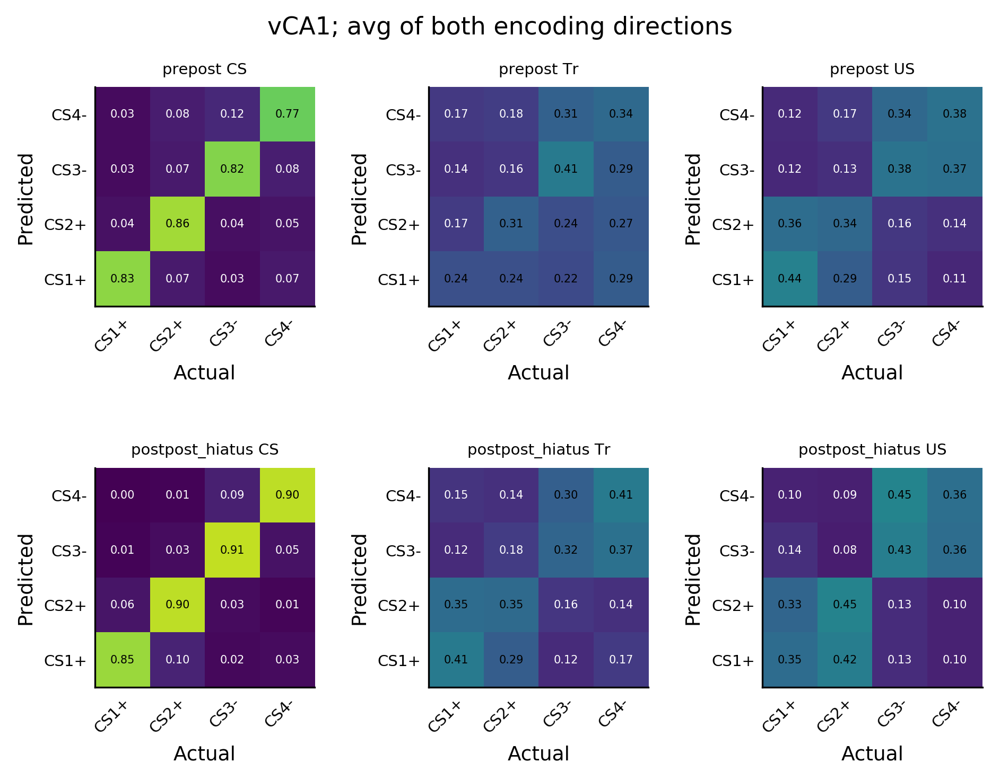

In [232]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*np.mean((heatmaps_test_vhpc_1s_%s,heatmaps_train_vhpc_1s_%s),0)[i]/np.sum(heatmaps_train_vhpc_1s_%s[i])"%(sess,sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1; avg of both encoding directions',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_dhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

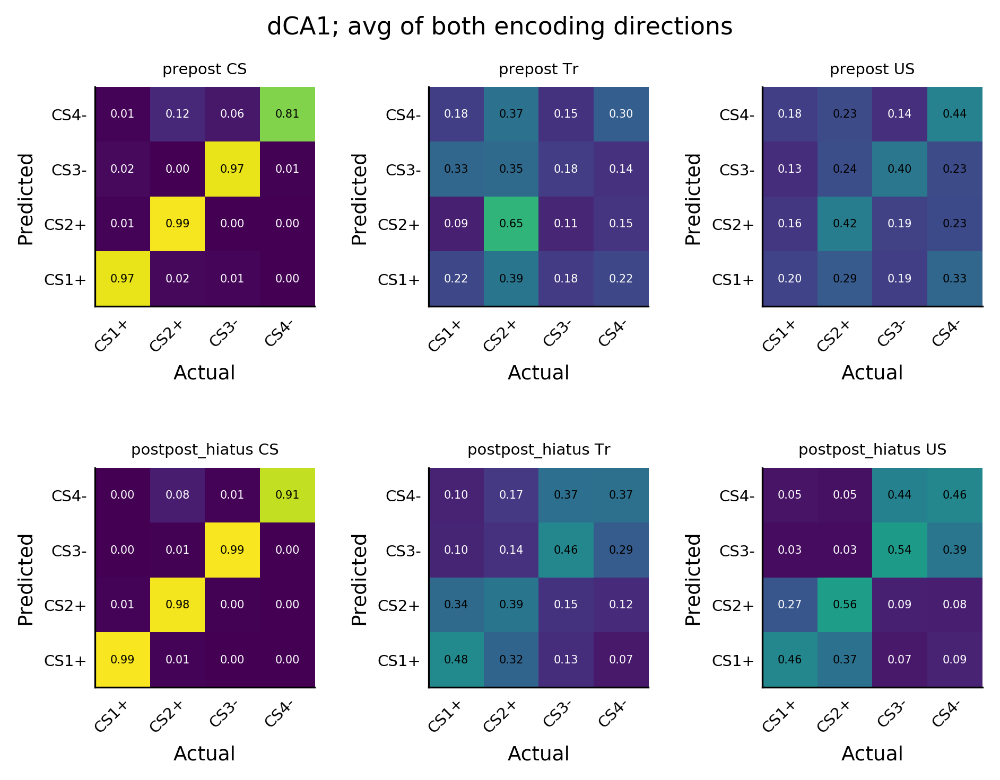

In [231]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("4.*np.mean((heatmaps_test_dhpc_1s_%s,heatmaps_train_dhpc_1s_%s),0)[i]/np.sum(heatmaps_train_dhpc_1s_%s[i])"%(sess,sess,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1; avg of both encoding directions',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_dhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

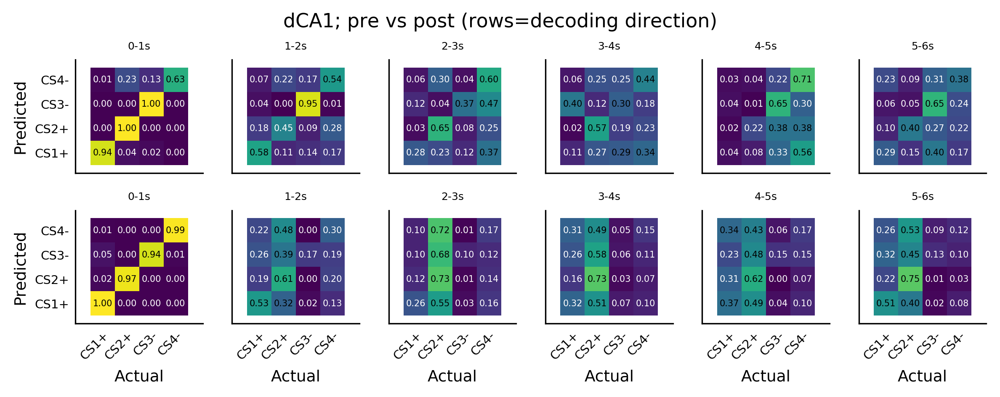

In [280]:
# plot 'em all
sess='prepost'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3),sharex=True,sharey=True)

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_%s_dhpc_1s_%s[i]/np.sum(heatmaps_%s_dhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1; pre vs post (rows=decoding direction)',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

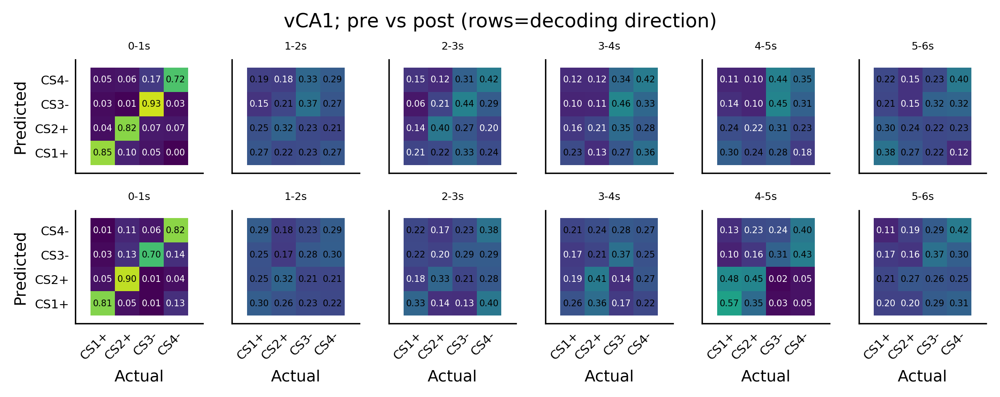

In [281]:
# plot 'em all
sess='prepost'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3),sharex=True,sharey=True)

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_%s_vhpc_1s_%s[i]/np.sum(heatmaps_%s_vhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1; pre vs post (rows=decoding direction)',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

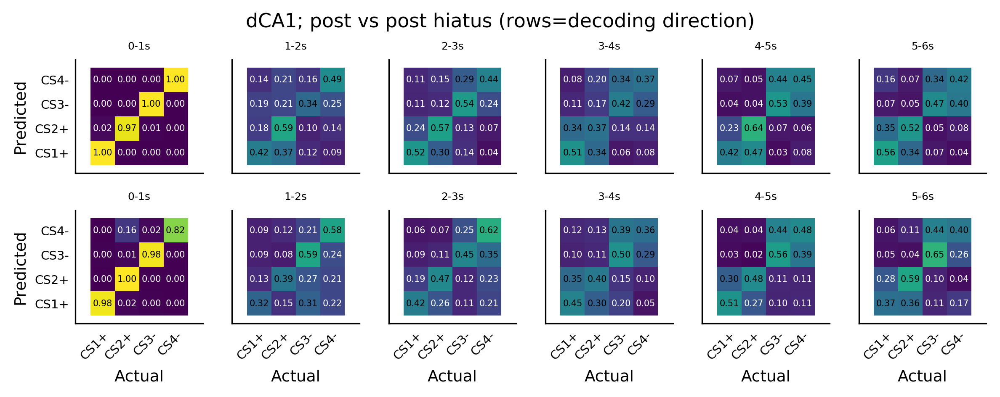

In [273]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3),sharex=True,sharey=True)

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_%s_dhpc_1s_%s[i]/np.sum(heatmaps_%s_dhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1; post vs post hiatus (rows=decoding direction)',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

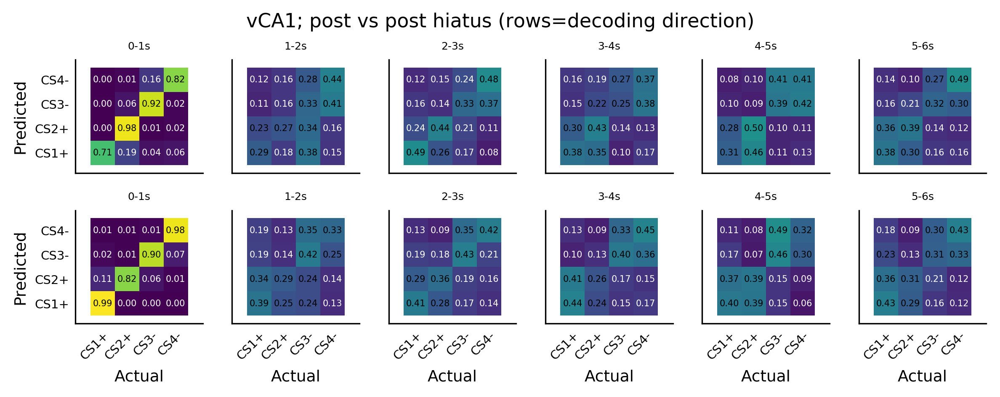

In [274]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3),sharex=True,sharey=True)

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*heatmaps_%s_vhpc_1s_%s[i]/np.sum(heatmaps_%s_vhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s"'%(la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1; post vs post hiatus (rows=decoding direction)',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

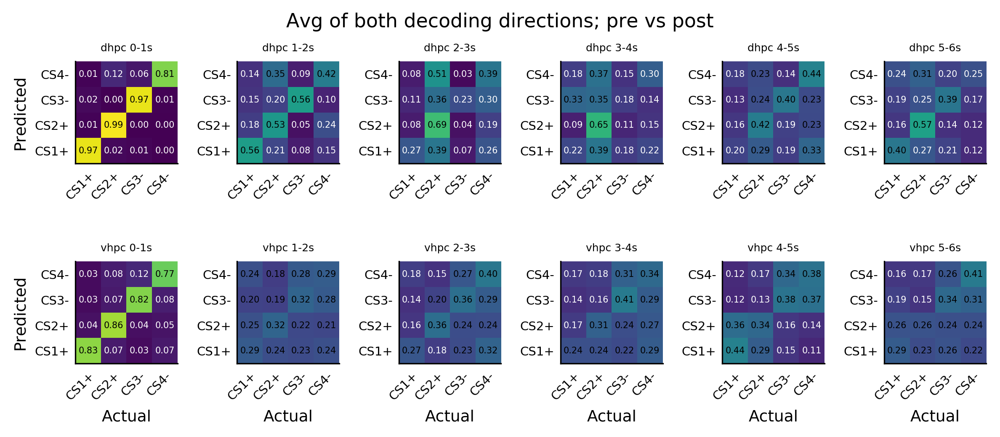

In [237]:
# plot 'em all
sess='prepost'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3.5))

for reg,r in zip(regions,(0,6)):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*np.mean((heatmaps_test_%s_1s_%s,heatmaps_train_%s_1s_%s),0)[i]/np.sum(heatmaps_test_%s_1s_%s[i])"%(reg,sess,reg,sess,reg,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(reg,la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('Avg of both decoding directions; pre vs post',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

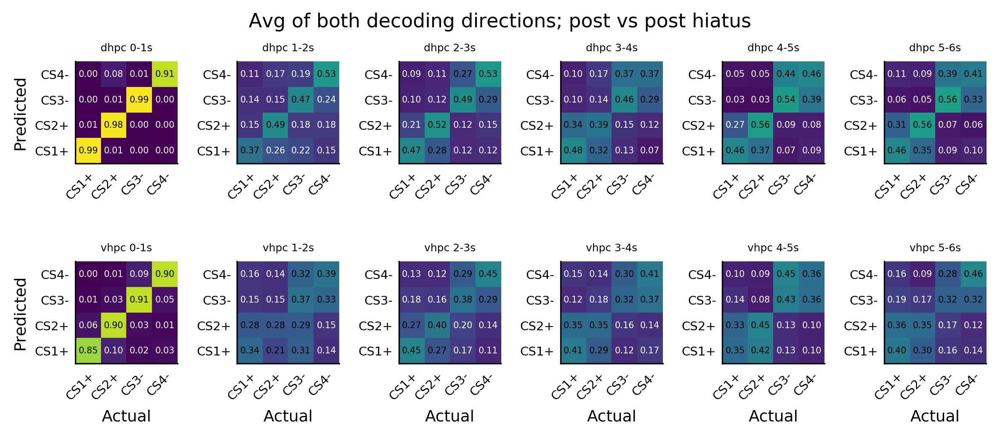

In [238]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3.5))

for reg,r in zip(regions,(0,6)):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("4.*np.mean((heatmaps_test_%s_1s_%s,heatmaps_train_%s_1s_%s),0)[i]/np.sum(heatmaps_test_%s_1s_%s[i])"%(reg,sess,reg,sess,reg,sess)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                     (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(reg,la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('Avg of both decoding directions; post vs post hiatus',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

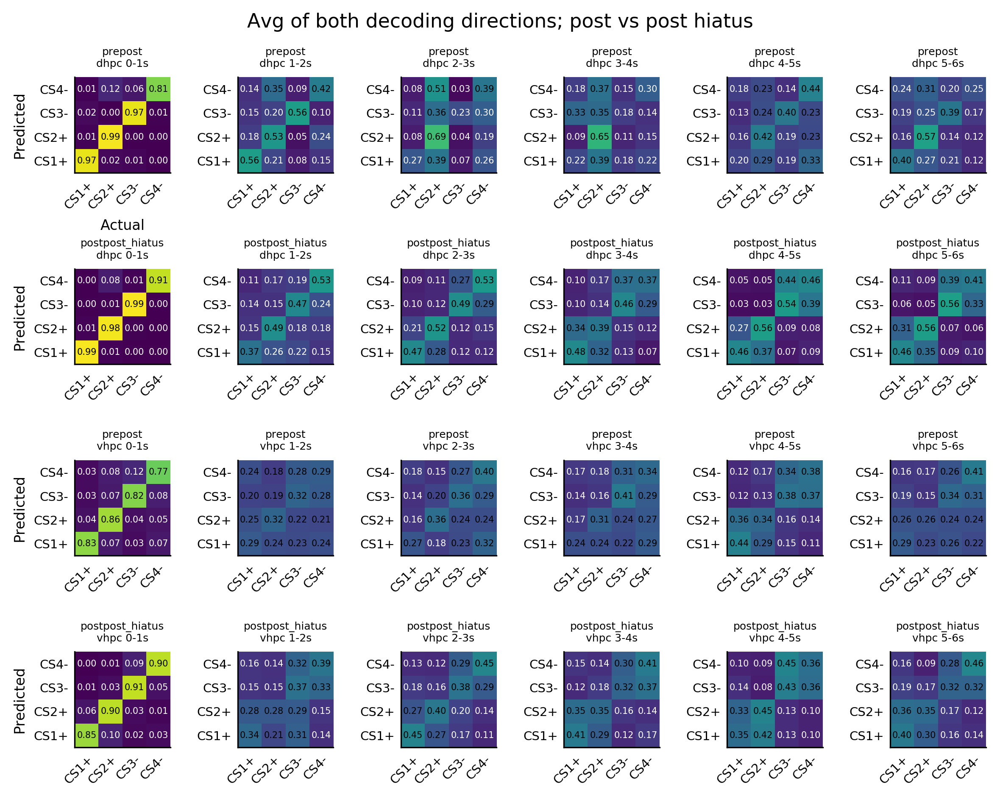

In [272]:
# plot 'em all
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = pl.subplots(4, 6, figsize=(8, 6))

for reg,r in zip(regions,(0,12)):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        for comp,k in zip(['prepost','postpost_hiatus'],[0,6]):
            q=j+k+r
            im = heatmap(eval("4.*np.mean((heatmaps_test_%s_1s_%s,heatmaps_train_%s_1s_%s),0)[i]/np.sum(heatmaps_test_%s_1s_%s[i])"%(reg,comp,reg,comp,reg,comp)),(['CS1+','CS2+', 'CS3-', 'CS4-']),
                         (['CS1+','CS2+', 'CS3-', 'CS4-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
            annotate_heatmap(im, valfmt="{x:.2f}", size=5)
            eval('ax%s'%q).set_title(eval('"%s\\n%s %s"'%(comp,reg,la)),fontsize=6)
for x in 1,:
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=8)
for x in 1,7,13,19:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=8)
pl.suptitle('Avg of both decoding directions; post vs post hiatus',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

# CS+ vs CS-

In [116]:
#append all loops
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("CSpm_test_predictions_%s_%s_%s_%s_appended = np.append(CSpm_test_predictions_%s_%s_%s_%s_0,CSpm_test_predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                CSpm_test_labels_appended = np.append(CSpm_test_labels,CSpm_test_labels)
                for n in range(2,loops):
                    exec("CSpm_test_predictions_%s_%s_%s_%s_appended = np.append(CSpm_test_predictions_%s_%s_%s_%s_appended,CSpm_test_predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    CSpm_test_labels_appended = np.append(CSpm_test_labels_appended,CSpm_test_labels)

In [118]:
#append all loops
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec("CSpm_train_predictions_%s_%s_%s_%s_appended = np.append(CSpm_train_predictions_%s_%s_%s_%s_0,CSpm_train_predictions_%s_%s_%s_%s_1)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t))
                CSpm_train_labels_appended = np.append(CSpm_test_labels,CSpm_test_labels)
                for n in range(2,loops):
                    exec("CSpm_train_predictions_%s_%s_%s_%s_appended = np.append(CSpm_train_predictions_%s_%s_%s_%s_appended,CSpm_train_predictions_%s_%s_%s_%s_%s)"%(reg,
                                                                                        tb,sess,t,reg,tb,sess,t,reg,tb,sess,t,n))
                    CSpm_train_labels_appended = np.append(CSpm_train_labels_appended,CSpm_test_labels)

In [120]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_CSpm_test_%s_%s_%s_%s_appended = confusion_matrix(CSpm_test_labels_appended,\
                      CSpm_test_predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,tb,sess,t))

In [121]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            for t in range(bin_ranges[i]): # number of time bins
                exec('conf_matr_CSpm_train_%s_%s_%s_%s_appended = confusion_matrix(CSpm_train_labels_appended,\
                      CSpm_train_predictions_%s_%s_%s_%s_appended)'%(reg,tb,sess,t,reg,tb,sess,t))

In [122]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_CSpm_test_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_CSpm_test_%s_%s_%s.append(conf_matr_CSpm_test_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))


In [123]:
for reg in regions:
    for sess in CR_comparisons:
        for tb,i in zip(bins[:2],range(len(bins[:2]))):
            exec("heatmaps_CSpm_train_%s_%s_%s = []")%(reg,tb,sess)
            for t in range(bin_ranges[i]): # number of time bins
                exec("heatmaps_CSpm_train_%s_%s_%s.append(conf_matr_CSpm_train_%s_%s_%s_%s_appended)"%(reg,tb,sess,reg,tb,sess,t))


## within-session using cross-registered cells

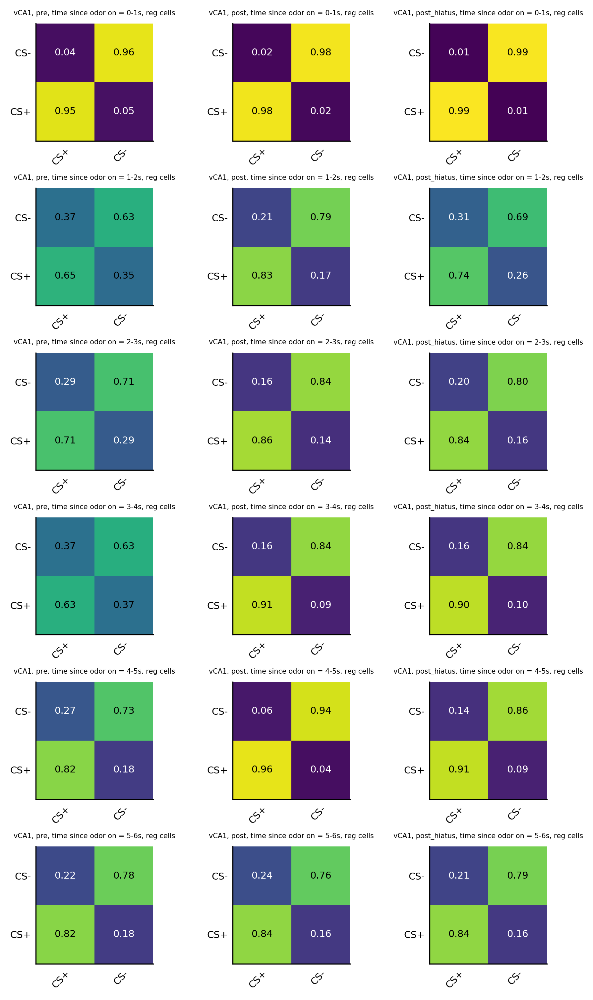

In [184]:
# plot 'em all
fig, ((ax0, ax1, ax2),(ax3, ax4, ax5),(ax6, ax7, ax8),(ax9, ax10, ax11),(ax12, ax13, ax14),(ax15, ax16, ax17),) = pl.subplots(6, 3, figsize=(6, 10))

session='pre'
for i,a in zip(range(5,11),range(0,16,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_vhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post'
for i,a in zip(range(5,11),range(1,17,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_vhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post_hiatus'
for i,a in zip(range(5,11),range(2,18,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_vhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"vCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

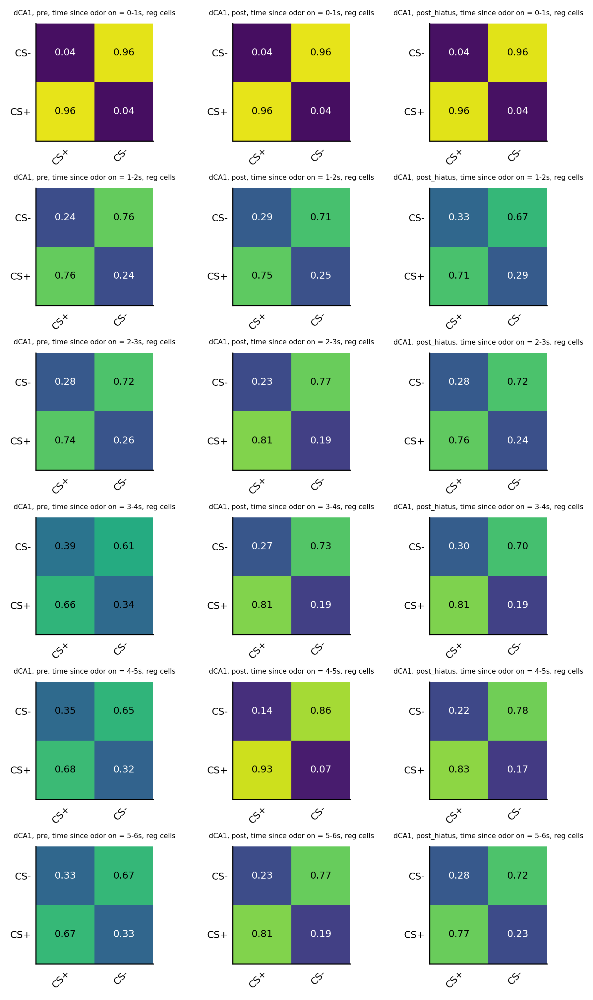

In [185]:
# plot 'em all
fig, ((ax0, ax1, ax2),(ax3, ax4, ax5),(ax6, ax7, ax8),(ax9, ax10, ax11),(ax12, ax13, ax14),(ax15, ax16, ax17),) = pl.subplots(6, 3, figsize=(6, 10))

session='pre'
for i,a in zip(range(5,11),range(0,16,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_dhpc_1s_%s[i]/np.sum(heatmaps_CSpm_dhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post'
for i,a in zip(range(5,11),range(1,17,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_dhpc_1s_%s[i]/np.sum(heatmaps_CSpm_dhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
session='post_hiatus'
for i,a in zip(range(5,11),range(2,18,3)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(eval("2.*heatmaps_CSpm_dhpc_1s_%s[i]/np.sum(heatmaps_CSpm_dhpc_1s_%s[i])"%(session,session)),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=7)
    eval('ax%s'%a).set_title(eval('"dCA1, %s, time since odor on = %s-%ss, reg cells"'%(session,str(i-5),str(i-4))),fontsize=5)
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_dhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

## across sessions

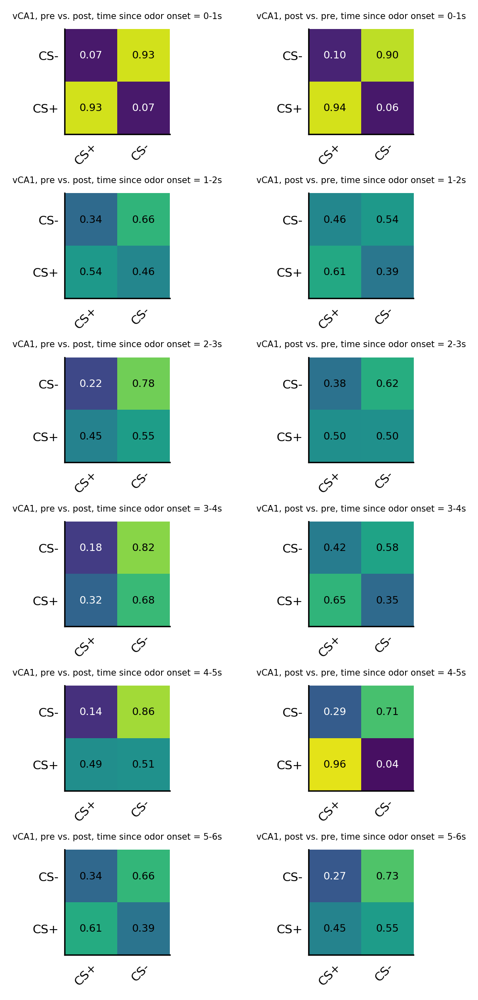

In [163]:
# plot 'em all

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7), (ax8, ax9), (ax10, ax11)) = pl.subplots(6, 2, figsize=(4,8))

for i,a in zip(range(5,11),range(0,11,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_test_vhpc_1s_prepost[i]/np.sum(heatmaps_CSpm_test_vhpc_1s_prepost[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"vCA1, pre vs. post, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=5)
for i,a in zip(range(5,11),range(1,12,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_train_vhpc_1s_prepost[i]/np.sum(heatmaps_CSpm_train_vhpc_1s_prepost[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"vCA1, post vs. pre, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=5)
    
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

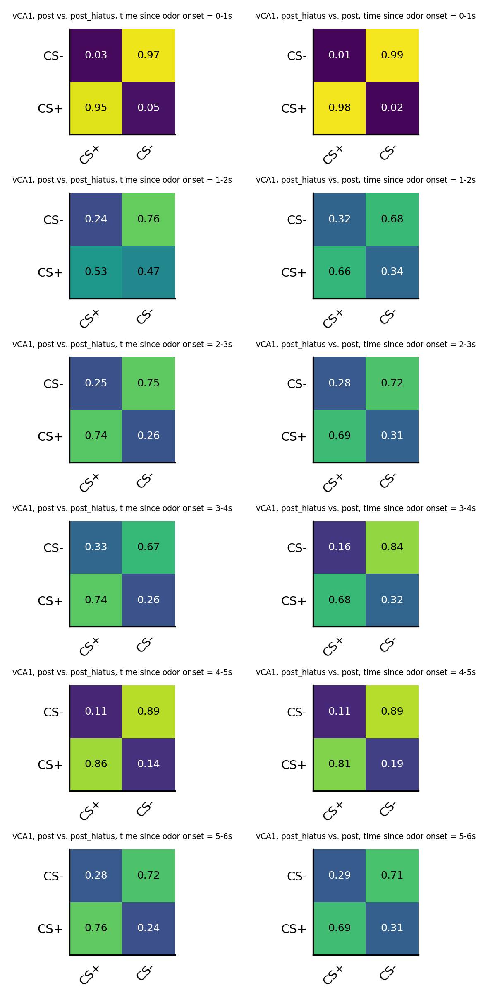

In [157]:
# plot 'em all

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7), (ax8, ax9), (ax10, ax11)) = pl.subplots(6, 2, figsize=(4,8))

for i,a in zip(range(5,11),range(0,11,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_test_vhpc_1s_postpost_hiatus[i]/np.sum(heatmaps_CSpm_test_vhpc_1s_postpost_hiatus[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"vCA1, post vs. post_hiatus, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=4.5)
for i,a in zip(range(5,11),range(1,12,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_train_vhpc_1s_postpost_hiatus[i]/np.sum(heatmaps_CSpm_train_vhpc_1s_postpost_hiatus[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"vCA1, post_hiatus vs. post, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=4.5)
    
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

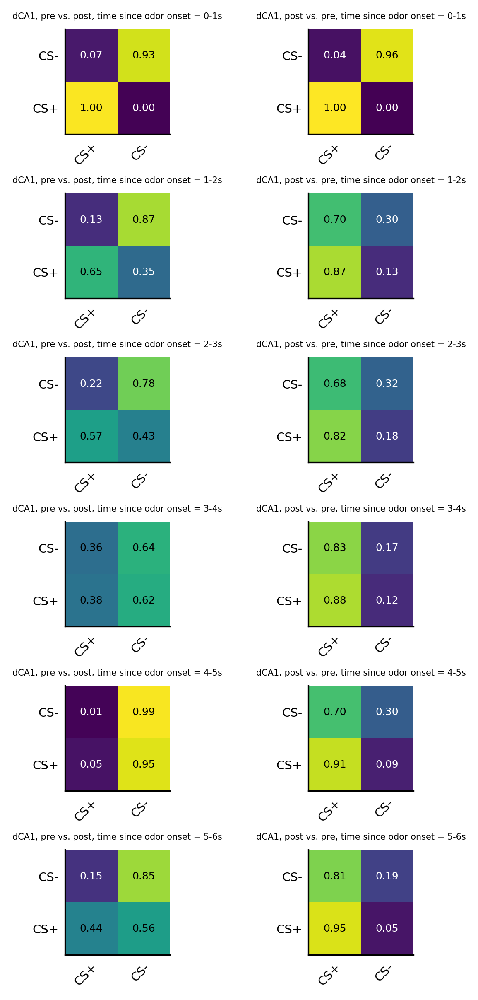

In [164]:
# plot 'em all

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7), (ax8, ax9), (ax10, ax11)) = pl.subplots(6, 2, figsize=(4,8))

for i,a in zip(range(5,11),range(0,11,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_test_dhpc_1s_prepost[i]/np.sum(heatmaps_CSpm_test_dhpc_1s_prepost[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"dCA1, pre vs. post, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=5)
for i,a in zip(range(5,11),range(1,12,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_train_dhpc_1s_prepost[i]/np.sum(heatmaps_CSpm_train_dhpc_1s_prepost[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"dCA1, post vs. pre, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=5)
    
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

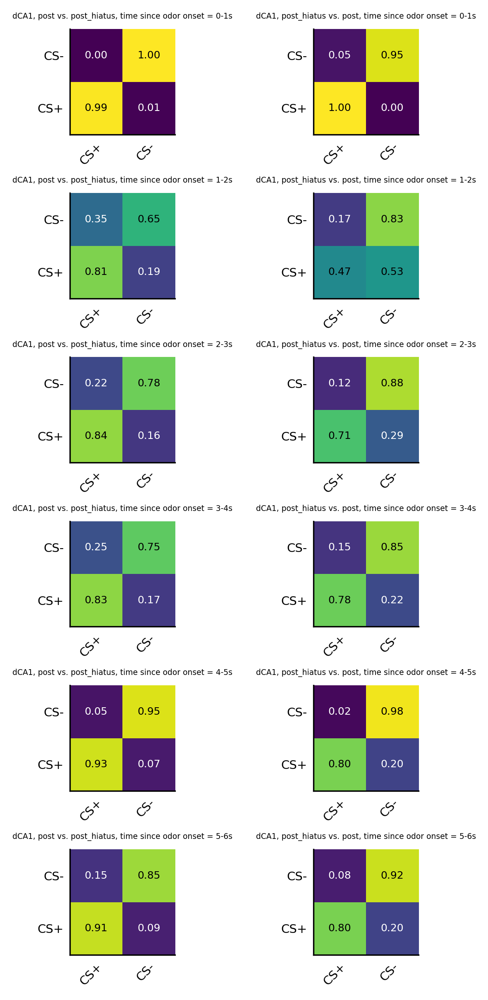

In [166]:
# plot 'em all

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7), (ax8, ax9), (ax10, ax11)) = pl.subplots(6, 2, figsize=(4,8))

for i,a in zip(range(5,11),range(0,11,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_test_dhpc_1s_postpost_hiatus[i]/np.sum(heatmaps_CSpm_test_dhpc_1s_postpost_hiatus[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"dCA1, post vs. post_hiatus, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=4.5)
for i,a in zip(range(5,11),range(1,12,2)): #look at six consecutive 1s bins, beginning at odor onset
    im = heatmap(2.*heatmaps_CSpm_train_dhpc_1s_postpost_hiatus[i]/np.sum(heatmaps_CSpm_train_dhpc_1s_postpost_hiatus[i]),(['CS+','CS-']),
                 (['CS+','CS-']), ax=eval('ax%s'%a),vmin=0,vmax=1)
    annotate_heatmap(im, valfmt="{x:.2f}", size=6)
    eval('ax%s'%a).set_title(eval('"dCA1, post_hiatus vs. post, time since odor onset = %s-%ss"'%(str(i-5),str(i-4))),fontsize=4.5)
    
pl.tight_layout()
pl.show()
#fig.savefig('../img/%s_vhpc_pre_ALL.jpg'%NOTEBOOK_NAME)

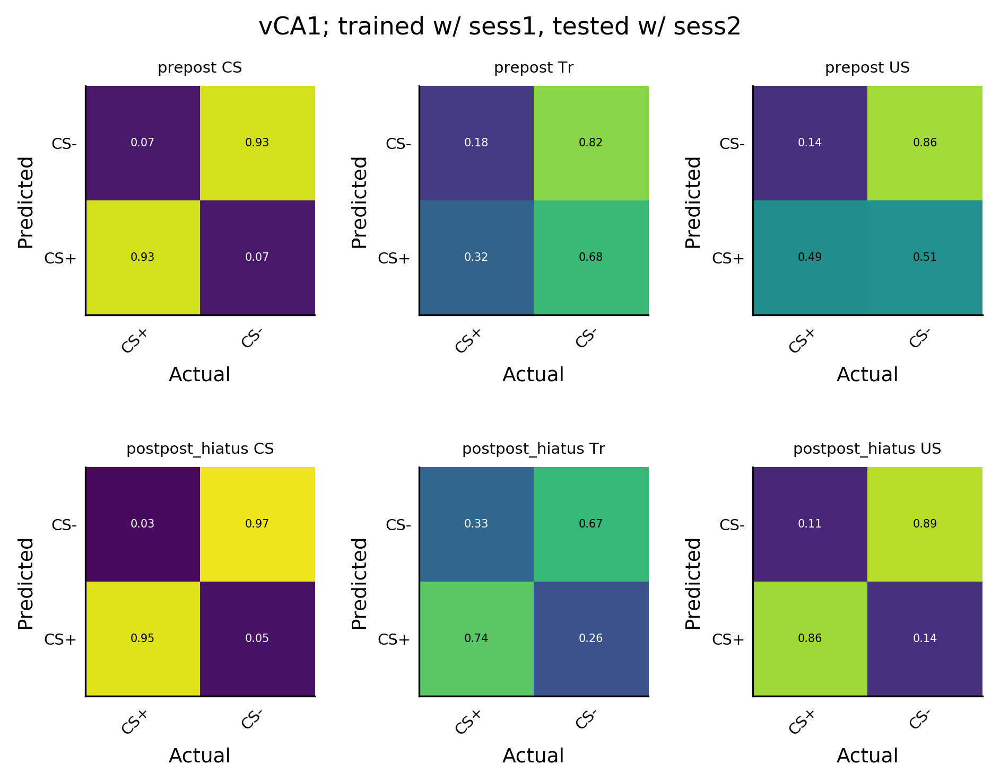

In [138]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_test_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_test_vhpc_1s_%s[i])"%(sess,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1; trained w/ sess1, tested w/ sess2',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

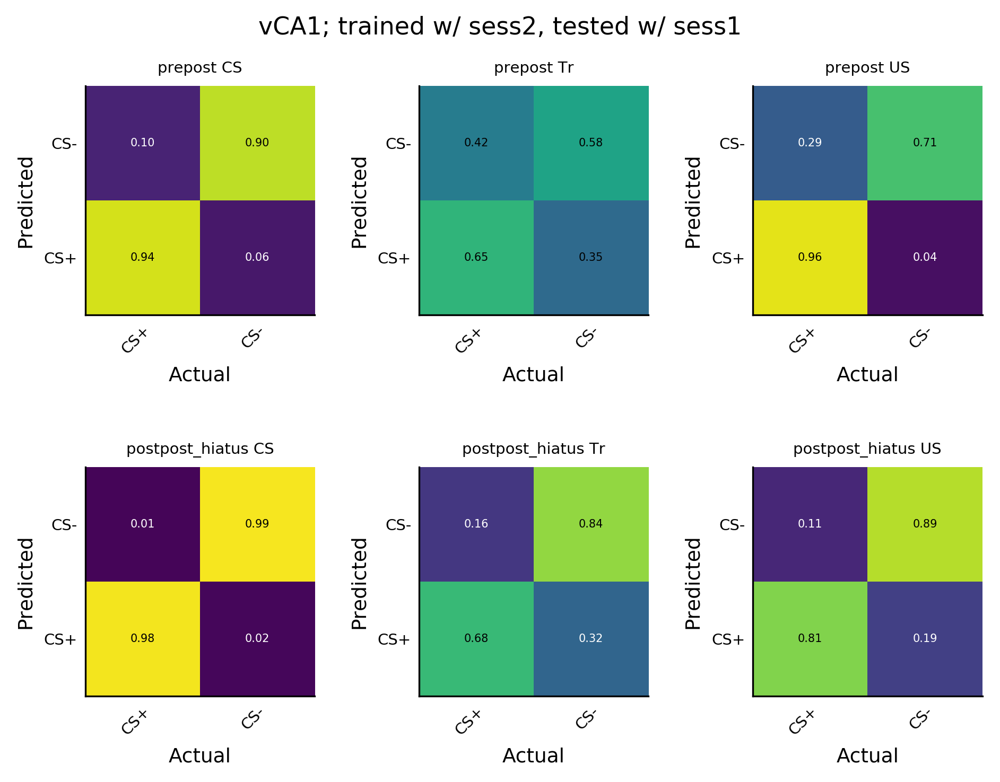

In [186]:
# plot 'em all

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = pl.subplots(2, 3, figsize=(6.5, 5))

for sess,r in zip(('prepost','postpost_hiatus'),(0,3)):
    for i,j,la in zip((5,8,9),(1,2,3),('CS','Tr','US')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_train_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_train_vhpc_1s_%s[i])"%(sess,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(sess,la)))
for x in range(1,7):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1; trained w/ sess2, tested w/ sess1',fontsize=11,y=1)
    
pl.tight_layout(pad=3)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

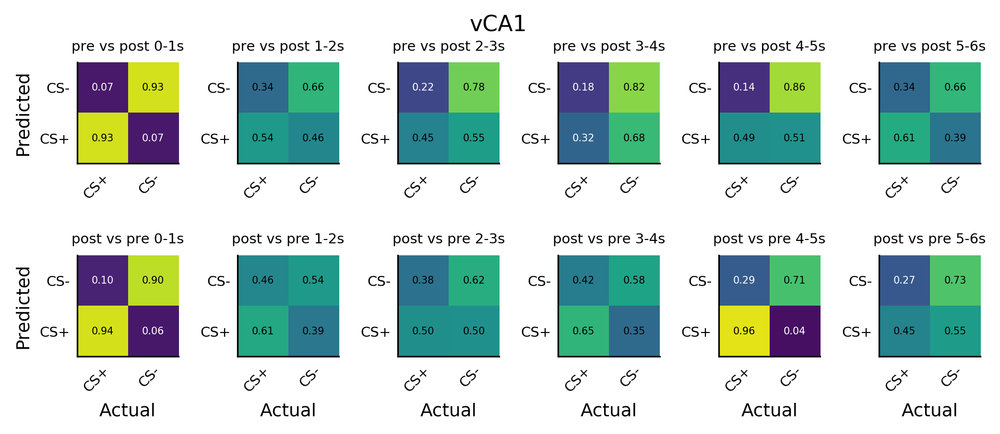

In [241]:
# plot 'em all
sess='prepost'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(7, 3))

for way,r,la1 in zip(('test','train'),(0,6),('pre vs post','post vs pre')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_%s_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_%s_vhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(la1,la)))
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

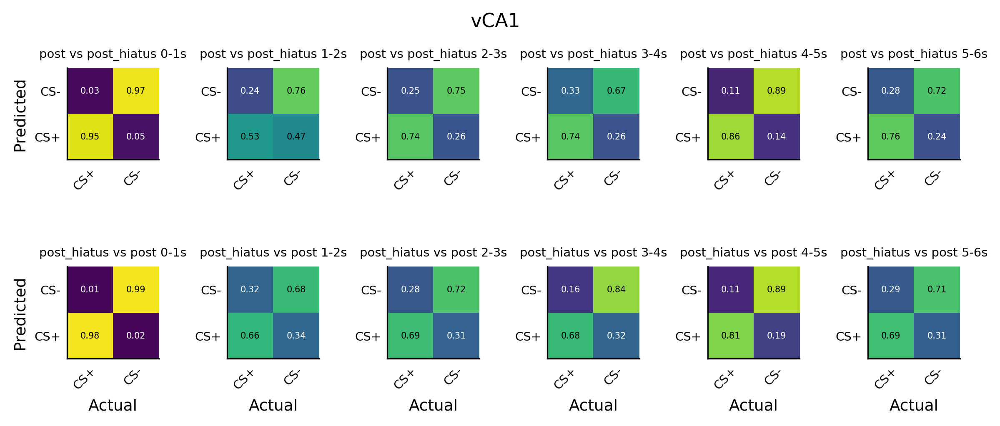

In [240]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3.5))

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_%s_vhpc_1s_%s[i]/np.sum(heatmaps_CSpm_%s_vhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(la1,la)))
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('vCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

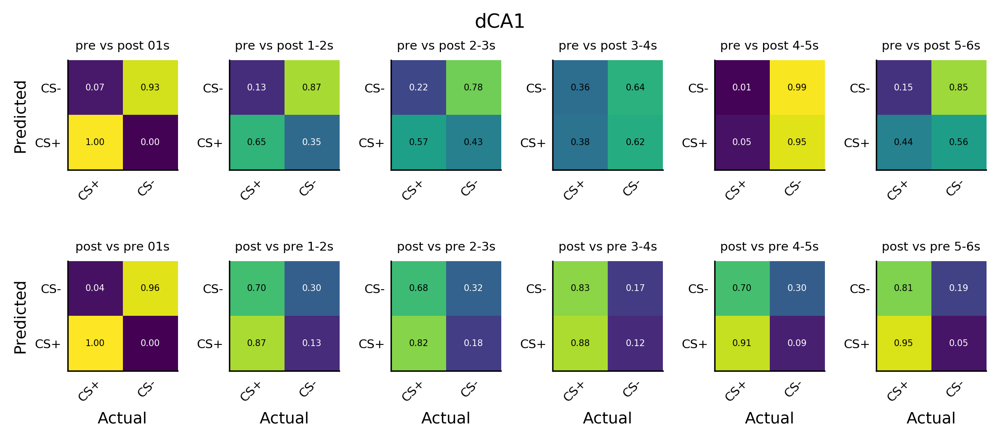

In [208]:
# plot 'em all
sess='prepost'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3.5))

for way,r,la1 in zip(('test','train'),(0,6),('pre vs post','post vs pre')):
    for i,j,la in zip(range(5,11),range(1,7),('01s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_%s_dhpc_1s_%s[i]/np.sum(heatmaps_CSpm_%s_dhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(la1,la)))
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

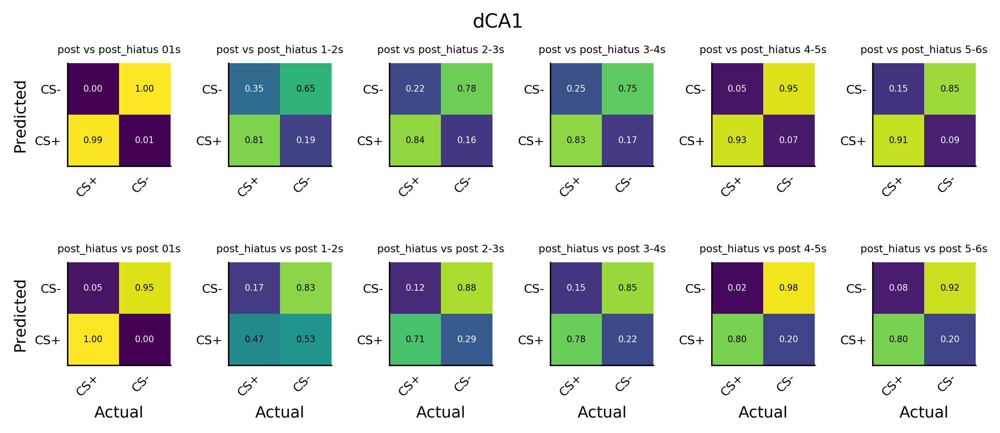

In [210]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(8, 3.5))

for way,r,la1 in zip(('test','train'),(0,6),('post vs post_hiatus','post_hiatus vs post')):
    for i,j,la in zip(range(5,11),range(1,7),('01s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("2.*heatmaps_CSpm_%s_dhpc_1s_%s[i]/np.sum(heatmaps_CSpm_%s_dhpc_1s_%s[i])"%(way,sess,way,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(la1,la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('dCA1',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

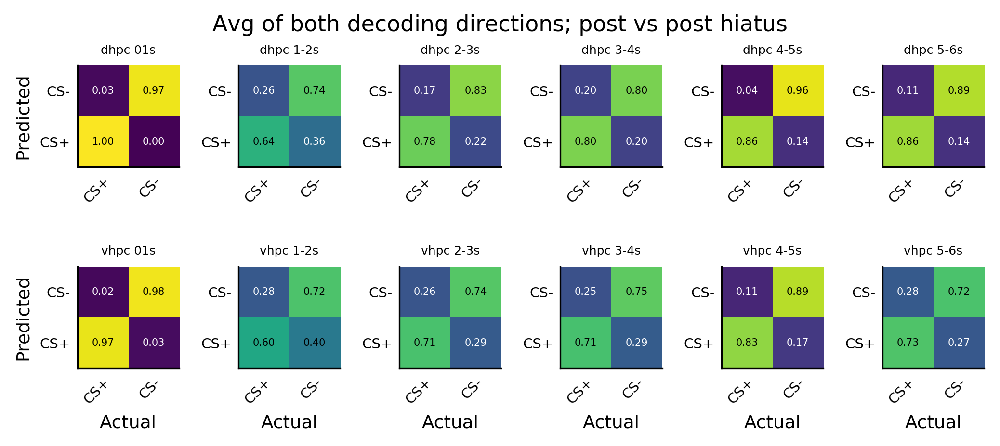

In [230]:
# plot 'em all
sess='postpost_hiatus'
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12)) = pl.subplots(2, 6, figsize=(7, 3.1))

for reg,r in zip(regions,(0,6)):
    for i,j,la in zip(range(5,11),range(1,7),('01s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        q=j+r
        im = heatmap(eval("2.*np.mean((heatmaps_CSpm_test_%s_1s_%s,heatmaps_CSpm_train_%s_1s_%s),0)[i]/np.sum(heatmaps_CSpm_test_%s_1s_%s[i])"%(reg,sess,reg,sess,reg,sess)),(['CS+','CS-']),
                     (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
        annotate_heatmap(im, valfmt="{x:.2f}", size=5)
        eval('ax%s'%q).set_title(eval('"%s %s"'%(reg,la)),fontsize=6)
for x in range(7,13):
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=9)
for x in 1,7:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=9)
pl.suptitle('Avg of both decoding directions; post vs post hiatus',fontsize=11,y=1)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

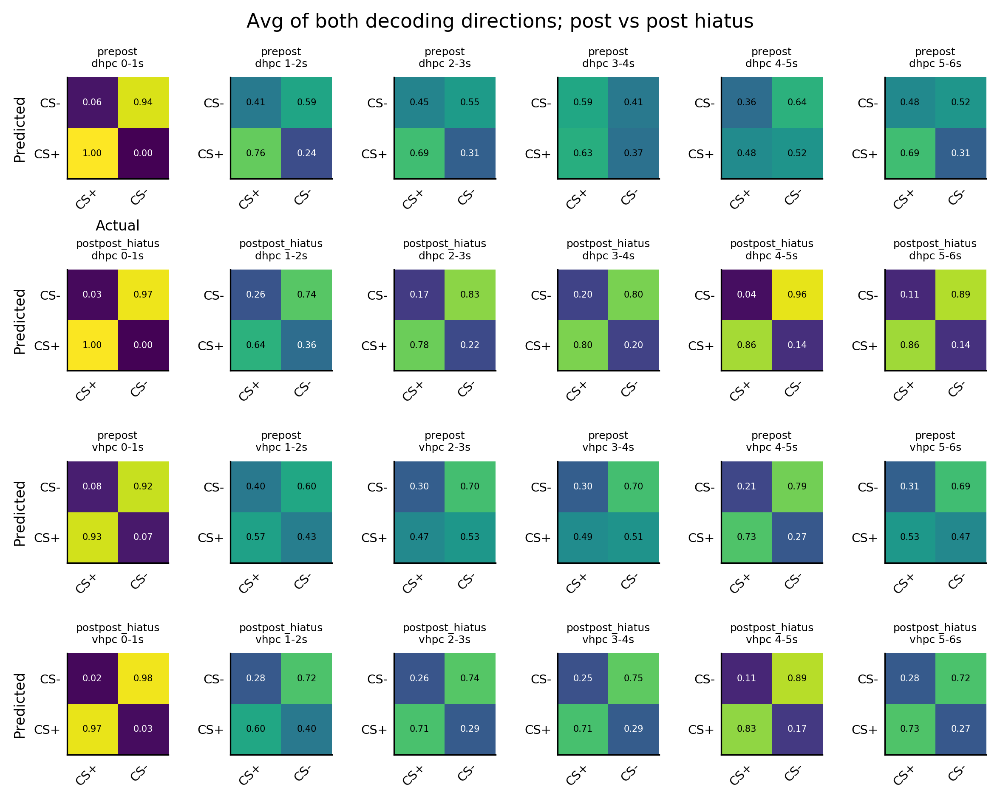

In [279]:
# plot 'em all
fig, ((ax1, ax2, ax3, ax4, ax5, ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = pl.subplots(4, 6, figsize=(8, 6))

for reg,r in zip(regions,(0,12)):
    for i,j,la in zip(range(5,11),range(1,7),('0-1s','1-2s','2-3s','3-4s','4-5s','5-6s')):
        for comp,k in zip(['prepost','postpost_hiatus'],[0,6]):
            q=j+k+r
            im = heatmap(eval("2.*np.mean((heatmaps_CSpm_test_%s_1s_%s,heatmaps_CSpm_train_%s_1s_%s),0)[i]/np.sum(heatmaps_test_%s_1s_%s[i])"%(reg,comp,reg,comp,reg,comp)),(['CS+','CS-']),
                         (['CS+','CS-']), ax=eval('ax%s'%q),vmin=0,vmax=1)
            annotate_heatmap(im, valfmt="{x:.2f}", size=5)
            eval('ax%s'%q).set_title(eval('"%s\\n%s %s"'%(comp,reg,la)),fontsize=6)
for x in 1,:
    eval('ax%s.set_xlabel'%x)('Actual',fontsize=8)
for x in 1,7,13,19:
    eval('ax%s.set_ylabel'%x)('Predicted',fontsize=8)
pl.suptitle('Avg of both decoding directions; post vs post hiatus',fontsize=11,y=1.03)
    
pl.tight_layout(pad=2)
pl.show()
#fig.savefig('../figures/%s_vhpc_prepost_1s.pdf'%NOTEBOOK_NAME)

In [173]:
save_workspace(db)

Could not store variable 'pickle'. Skipping...
Could not store variable 'matplotlib'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'os'. Skipping...
Could not store variable 'sstats'. Skipping...
Could not store variable 'np'. Skipping...
Could not store variable 'IPython'. Skipping...
